In [3]:
# Cell 1: Importing  Libraries
# Basic imports and configuration
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, Model, Input
from tensorflow.keras.optimizers.schedules import ExponentialDecay
import matplotlib.pyplot as plt
import pickle
import datetime

# Enable GPU growth if available (for faster training)
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("GPU memory growth enabled.")
    except RuntimeError as e:
        print(e)
        
# Set random seed for reproducibility
tf.random.set_seed(42)
np.random.seed(42)


GPU memory growth enabled.


In [5]:
#Cell 2:Checking GPU Stats
import tensorflow as tf

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print("GPU(s) detected:")
    for gpu in gpus:
        print(f" - {gpu}")
else:
    print("No GPU detected.")


GPU(s) detected:
 - PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [6]:
# ================================
# Cell 3: Local Paths & Dataset Setup
# ================================

import os
import numpy as np
import pandas as pd
import tensorflow as tf

# 1. Set local paths for CK+ and FER-2013 datasets
ck_path = "data/ck+"
fer_path = "data/fer2013"

# 2. Print subfolders in FER-2013 (train & test)
fer_train_dir = os.path.join(fer_path, "train")
fer_test_dir = os.path.join(fer_path, "test")

print("FER-2013 Train folders:", os.listdir(fer_train_dir))
print("FER-2013 Test folders:", os.listdir(fer_test_dir))

# 3. Inspect CK+ dataset folder
ck_files = os.listdir(ck_path)
print("Files in CK+ dataset folder:", ck_files)

# 4. Locate the CSV file in CK+ (e.g., ckextended.csv)
csv_files = [f for f in ck_files if f.endswith('.csv')]
if csv_files:
    ck_csv_path = os.path.join(ck_path, csv_files[0])
    ck_df = pd.read_csv(ck_csv_path)
    print("CK+ Dataset Preview:")
    print(ck_df.head())
    print("\nCK+ Data Info:")
    print(ck_df.info())
else:
    print("No CSV file found in CK+ dataset folder. Please verify the dataset structure for CK+.")



FER-2013 Train folders: ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']
FER-2013 Test folders: ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']
Files in CK+ dataset folder: ['ckextended.csv']
CK+ Dataset Preview:
   emotion                                             pixels     Usage
0        6  36 39 35 25 19 11 8 7 3 13 15 9 21 57 75 90 10...  Training
1        6  88 74 19 4 5 5 3 12 8 21 15 21 15 18 24 29 32 ...  Training
2        6  9 2 4 7 1 1 1 0 7 29 49 76 115 141 156 169 177...  Training
3        6  104 106 108 104 95 50 60 61 58 83 126 133 139 ...  Training
4        6  68 72 67 67 6 2 1 1 1 1 1 14 24 24 38 65 79 94...  Training

CK+ Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 920 entries, 0 to 919
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   emotion  920 non-null    int64 
 1   pixels   920 non-null    object
 2   Usage    920 non-null    object
dtypes: int

In [7]:
# ================================
# Cell 4: Data Preprocessing Functions (64×64, grayscale→RGB)
# ================================

# Define emotion mapping for both datasets.
emotion_mapping = {
    "angry": 0,
    "disgust": 1,
    "fear": 2,
    "happy": 3,
    "sad": 4,
    "surprise": 5,
    "neutral": 6,
    "contempt": 7
}

# Function to preprocess a single image:
# Reads an image, decodes as grayscale, optionally converts to RGB, and resizes to 64×64.
def preprocess_image(image_path, convert_to_rgb=True):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=1)  # decode as grayscale
    if convert_to_rgb:
        image = tf.image.grayscale_to_rgb(image)  # shape becomes (height, width, 3)
    image = tf.image.resize(image, [64, 64])
    image = tf.image.convert_image_dtype(image, tf.float32)
    # Scale pixel values from [0,1] to [-1,1]
    image = (image - 0.5) * 2.0
    return image

# Function to load FER-2013 dataset using tf.keras utilities.
def load_fer_dataset(data_dir, subset='train', convert_to_rgb=True):
    color_mode = "rgb" if convert_to_rgb else "grayscale"
    ds = tf.keras.preprocessing.image_dataset_from_directory(
        data_dir,
        labels='inferred',
        label_mode='int',
        color_mode=color_mode,
        batch_size=64,
        image_size=(64, 64),  # 64×64
        shuffle=True
    )
    # Rescale images to [-1,1]
    ds = ds.map(lambda x, y: ((tf.cast(x, tf.float32) / 255.0 - 0.5) * 2.0, y))
    return ds

# Function to load CK+ dataset from CSV.
def load_ck_dataset(csv_path, convert_to_rgb=True):
    df = pd.read_csv(csv_path)
    images = []
    labels = []
    for idx, row in df.iterrows():
        # Convert space-separated pixel values into a numpy array and reshape (48×48, 1 channel)
        pixel_vals = np.array(list(map(float, row['pixels'].split())), dtype=np.float32)
        image = pixel_vals.reshape(48, 48, 1)
        # Resize image from 48×48 to 64×64
        image = tf.image.resize(image, [64, 64]).numpy()
        if convert_to_rgb:
            # Convert grayscale to RGB by repeating the channel 3 times
            image = np.repeat(image, 3, axis=-1)
        # Scale pixel values from [0,255] to [-1,1]
        image = (image / 255.0 - 0.5) * 2.0
        images.append(image)
        labels.append(int(row['emotion']))
    images = np.array(images)
    labels = np.array(labels)
    return images, labels


In [8]:
# ================================
# Cell 5. Combine & Shuffle Datasets
# ================================

# Load FER-2013 training dataset (using the local path and converting to RGB)
fer_train_ds = load_fer_dataset(fer_train_dir, subset='train', convert_to_rgb=True)

# Load CK+ dataset if CSV exists; note that CK+ images are resized to 64x64 and converted to RGB
if os.path.exists(ck_csv_path):
    ck_images, ck_labels = load_ck_dataset(ck_csv_path, convert_to_rgb=True)
    print("Loaded CK+ dataset with {} images.".format(len(ck_images)))
else:
    # Create empty arrays with the expected shape: (0, 64, 64, 3)
    ck_images, ck_labels = np.empty((0, 64, 64, 3)), np.empty((0,), dtype=int)
    print("CK+ dataset not loaded.")

# Convert FER-2013 tf.data.Dataset to numpy arrays for combining
fer_images_list = []
fer_labels_list = []
for images, labels in fer_train_ds:
    fer_images_list.append(images.numpy())
    fer_labels_list.append(labels.numpy())
fer_images = np.concatenate(fer_images_list, axis=0)
fer_labels = np.concatenate(fer_labels_list, axis=0)

print("FER-2013 dataset loaded: {} images.".format(len(fer_images)))

# Combine the two datasets
combined_images = np.concatenate([fer_images, ck_images], axis=0)
combined_labels = np.concatenate([fer_labels, ck_labels], axis=0)
print("Combined dataset has {} images with {} labels.".format(len(combined_images), len(combined_labels)))

# Create a tf.data.Dataset for training
BUFFER_SIZE = 10000
BATCH_SIZE = 64

train_dataset = tf.data.Dataset.from_tensor_slices((combined_images, combined_labels))
train_dataset = train_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)


Found 28709 files belonging to 7 classes.
Loaded CK+ dataset with 920 images.
FER-2013 dataset loaded: 28709 images.
Combined dataset has 29629 images with 29629 labels.


In [9]:
# Cell 6. Define the Simplified BigGAN (Conditional GAN) Models for 64×64 RGB images

import tensorflow as tf
from tensorflow.keras import layers, Model, Input

num_classes = 8   # based on our emotion mapping
noise_dim = 128   # dimension of the noise vector

def build_generator():
    # Generator inputs: noise vector and label
    noise_input = Input(shape=(noise_dim,), name='noise_input')
    label_input = Input(shape=(1,), dtype='int32', name='label_input')
    
    # Embed the label and flatten it
    label_embedding = layers.Embedding(num_classes, noise_dim, input_length=1)(label_input)
    label_embedding = layers.Flatten()(label_embedding)
    
    # Element-wise multiplication of noise and label embedding
    combined_input = layers.multiply([noise_input, label_embedding])
    
    # Project and reshape to start with a small feature map (4x4x256)
    x = layers.Dense(4 * 4 * 256, use_bias=False)(combined_input)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Reshape((4, 4, 256))(x)
    
    # Upsampling blocks to reach 64x64:
    # 4x4 -> 8x8
    x = layers.Conv2DTranspose(128, kernel_size=4, strides=2, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    
    # 8x8 -> 16x16
    x = layers.Conv2DTranspose(64, kernel_size=4, strides=2, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    
    # 16x16 -> 32x32
    x = layers.Conv2DTranspose(32, kernel_size=4, strides=2, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    
    # 32x32 -> 64x64
    x = layers.Conv2DTranspose(16, kernel_size=4, strides=2, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    
    # Final layer: output 64x64 RGB image with 'tanh' activation
    output = layers.Conv2D(3, kernel_size=3, padding='same', activation='tanh')(x)
    
    generator = Model([noise_input, label_input], output, name='Generator')
    return generator

def build_discriminator():
    # Discriminator input: 64x64 RGB image
    image_input = Input(shape=(64, 64, 3), name='image_input')
    label_input = Input(shape=(1,), dtype='int32', name='label_input')
    
    # Process the label: embed and reshape to a 64x64 map (1 channel)
    label_embedding = layers.Embedding(num_classes, 64 * 64, input_length=1)(label_input)
    label_embedding = layers.Flatten()(label_embedding)
    label_embedding = layers.Reshape((64, 64, 1))(label_embedding)
    
    # Concatenate image and label embedding along the channel axis; output shape becomes (64,64,3+1=4)
    combined_input = layers.Concatenate(axis=-1)([image_input, label_embedding])
    
    # Convolutional blocks for discrimination:
    x = layers.Conv2D(32, kernel_size=3, strides=2, padding='same')(combined_input)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Dropout(0.3)(x)
    
    x = layers.Conv2D(64, kernel_size=3, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Dropout(0.3)(x)
    
    x = layers.Conv2D(128, kernel_size=3, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Dropout(0.3)(x)
    
    x = layers.Flatten()(x)
    x = layers.Dense(1)(x)  # Linear output (used with sigmoid cross-entropy loss)
    
    discriminator = Model([image_input, label_input], x, name='Discriminator')
    return discriminator

# Create the models
generator = build_generator()
discriminator = build_discriminator()

# Print model summaries to verify the output shapes
generator.summary()
discriminator.summary()


Model: "Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 label_input (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 embedding (Embedding)          (None, 1, 128)       1024        ['label_input[0][0]']            
                                                                                                  
 noise_input (InputLayer)       [(None, 128)]        0           []                               
                                                                                                  
 flatten (Flatten)              (None, 128)          0           ['embedding[0][0]']              
                                                                                          

In [10]:
# Cell 7. Loss Functions & Optimizers with Dynamic Learning Rate
# Define the loss functions
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

# Dynamic learning rate schedules using ExponentialDecay
initial_lr = 0.0002
lr_decay = ExponentialDecay(initial_lr, decay_steps=1000, decay_rate=0.95, staircase=True)

generator_optimizer = tf.keras.optimizers.Adam(learning_rate=lr_decay, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=lr_decay, beta_1=0.5)


In [11]:
# Directory to save checkpoints and history
checkpoint_dir = './training_checkpoints'
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)

history_dir = './training_history'
if not os.path.exists(history_dir):
    os.makedirs(history_dir)

# Setup tf.train.Checkpoint for saving generator, discriminator, and optimizers along with epoch counter
checkpoint = tf.train.Checkpoint(
    generator=generator,
    discriminator=discriminator,
    generator_optimizer=generator_optimizer,
    discriminator_optimizer=discriminator_optimizer,
    epoch=tf.Variable(0)
)

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")

# Function to save training history every 50 epochs
def save_training_history(history, epoch):
    history_file = os.path.join(history_dir, f'history_epoch_{epoch}.pkl')
    with open(history_file, 'wb') as f:
        pickle.dump(history, f)
    print(f"Training history saved at epoch {epoch} to {history_file}")


In [24]:
# Restore from the latest checkpoint if available
latest_checkpoint = tf.train.latest_checkpoint(checkpoint_dir)
if latest_checkpoint:
    checkpoint.restore(latest_checkpoint)
    start_epoch = int(checkpoint.epoch.numpy()) + 1
    print(f"Restored from checkpoint: starting at epoch {start_epoch}")
else:
    start_epoch = 1
    print("No checkpoint found, starting training from epoch 1.")


Restored from checkpoint: starting at epoch 2001


Starting training at epoch 2001...
Epoch 2001/3000
  Generator loss: 1.2773 | Discriminator loss: 0.9139
Epoch 2002/3000
  Generator loss: 1.2804 | Discriminator loss: 0.9179
Epoch 2003/3000
  Generator loss: 1.2773 | Discriminator loss: 0.9083
Epoch 2004/3000
  Generator loss: 1.2866 | Discriminator loss: 0.9050
Epoch 2005/3000
  Generator loss: 1.2800 | Discriminator loss: 0.9107
  Checkpoint saved at epoch 2005.
Epoch 2006/3000
  Generator loss: 1.2780 | Discriminator loss: 0.9152
Epoch 2007/3000
  Generator loss: 1.2701 | Discriminator loss: 0.9152
Epoch 2008/3000
  Generator loss: 1.2898 | Discriminator loss: 0.9073
Epoch 2009/3000
  Generator loss: 1.2730 | Discriminator loss: 0.9157
Epoch 2010/3000
  Generator loss: 1.2868 | Discriminator loss: 0.9115
  Checkpoint saved at epoch 2010.


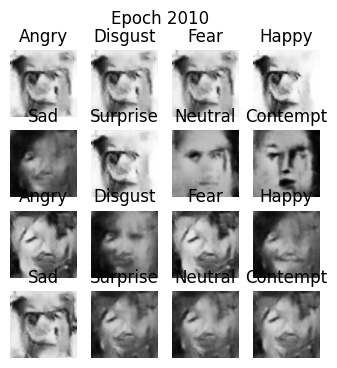

Epoch 2011/3000
  Generator loss: 1.2805 | Discriminator loss: 0.9152
Epoch 2012/3000
  Generator loss: 1.2762 | Discriminator loss: 0.9153
Epoch 2013/3000
  Generator loss: 1.2709 | Discriminator loss: 0.9165
Epoch 2014/3000
  Generator loss: 1.2731 | Discriminator loss: 0.9160
Epoch 2015/3000
  Generator loss: 1.2818 | Discriminator loss: 0.9156
  Checkpoint saved at epoch 2015.
Epoch 2016/3000
  Generator loss: 1.2709 | Discriminator loss: 0.9134
Epoch 2017/3000
  Generator loss: 1.2700 | Discriminator loss: 0.9186
Epoch 2018/3000
  Generator loss: 1.2722 | Discriminator loss: 0.9143
Epoch 2019/3000
  Generator loss: 1.2675 | Discriminator loss: 0.9171
Epoch 2020/3000
  Generator loss: 1.2654 | Discriminator loss: 0.9184
  Checkpoint saved at epoch 2020.


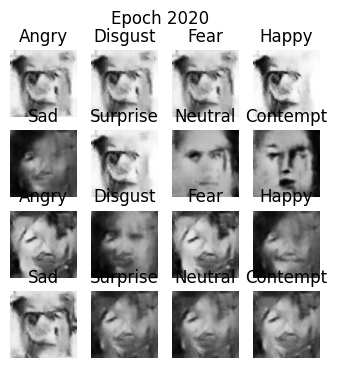

Epoch 2021/3000
  Generator loss: 1.2584 | Discriminator loss: 0.9191
Epoch 2022/3000
  Generator loss: 1.2778 | Discriminator loss: 0.9177
Epoch 2023/3000
  Generator loss: 1.2808 | Discriminator loss: 0.9124
Epoch 2024/3000
  Generator loss: 1.2888 | Discriminator loss: 0.9120
Epoch 2025/3000
  Generator loss: 1.2795 | Discriminator loss: 0.9129
  Checkpoint saved at epoch 2025.
Epoch 2026/3000
  Generator loss: 1.2800 | Discriminator loss: 0.9126
Epoch 2027/3000
  Generator loss: 1.2808 | Discriminator loss: 0.9124
Epoch 2028/3000
  Generator loss: 1.2739 | Discriminator loss: 0.9161
Epoch 2029/3000
  Generator loss: 1.2761 | Discriminator loss: 0.9166
Epoch 2030/3000
  Generator loss: 1.2683 | Discriminator loss: 0.9153
  Checkpoint saved at epoch 2030.


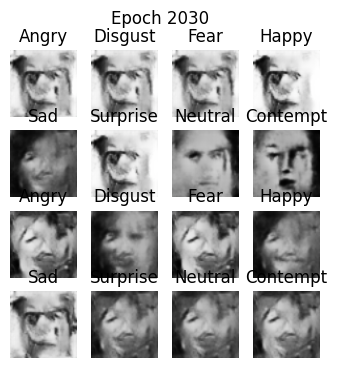

Epoch 2031/3000
  Generator loss: 1.2660 | Discriminator loss: 0.9201
Epoch 2032/3000
  Generator loss: 1.2758 | Discriminator loss: 0.9159
Epoch 2033/3000
  Generator loss: 1.2737 | Discriminator loss: 0.9116
Epoch 2034/3000
  Generator loss: 1.2706 | Discriminator loss: 0.9191
Epoch 2035/3000
  Generator loss: 1.2887 | Discriminator loss: 0.9147
  Checkpoint saved at epoch 2035.
Epoch 2036/3000
  Generator loss: 1.2748 | Discriminator loss: 0.9129
Epoch 2037/3000
  Generator loss: 1.2739 | Discriminator loss: 0.9133
Epoch 2038/3000
  Generator loss: 1.2858 | Discriminator loss: 0.9053
Epoch 2039/3000
  Generator loss: 1.2761 | Discriminator loss: 0.9138
Epoch 2040/3000
  Generator loss: 1.2601 | Discriminator loss: 0.9228
  Checkpoint saved at epoch 2040.


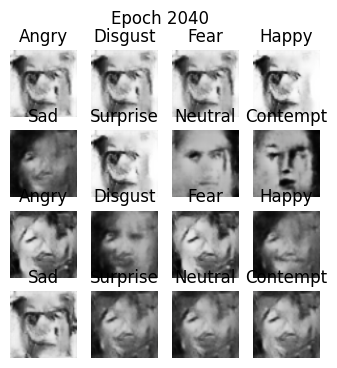

Epoch 2041/3000
  Generator loss: 1.2711 | Discriminator loss: 0.9146
Epoch 2042/3000
  Generator loss: 1.2679 | Discriminator loss: 0.9176
Epoch 2043/3000
  Generator loss: 1.2784 | Discriminator loss: 0.9138
Epoch 2044/3000
  Generator loss: 1.2741 | Discriminator loss: 0.9147
Epoch 2045/3000
  Generator loss: 1.2824 | Discriminator loss: 0.9151
  Checkpoint saved at epoch 2045.
Epoch 2046/3000
  Generator loss: 1.2878 | Discriminator loss: 0.9097
Epoch 2047/3000
  Generator loss: 1.2716 | Discriminator loss: 0.9152
Epoch 2048/3000
  Generator loss: 1.2759 | Discriminator loss: 0.9164
Epoch 2049/3000
  Generator loss: 1.2752 | Discriminator loss: 0.9136
Epoch 2050/3000
  Generator loss: 1.2828 | Discriminator loss: 0.9117
  Checkpoint saved at epoch 2050.
Training history saved at epoch 2050 to ./training_history\history_epoch_2050.pkl


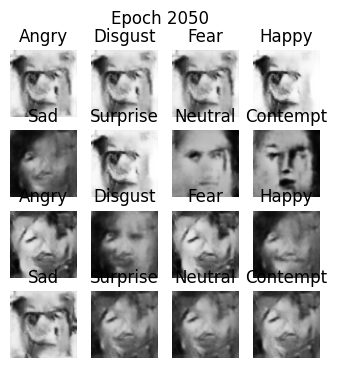

Epoch 2051/3000
  Generator loss: 1.2811 | Discriminator loss: 0.9138
Epoch 2052/3000
  Generator loss: 1.2748 | Discriminator loss: 0.9130
Epoch 2053/3000
  Generator loss: 1.2693 | Discriminator loss: 0.9164
Epoch 2054/3000
  Generator loss: 1.2685 | Discriminator loss: 0.9166
Epoch 2055/3000
  Generator loss: 1.2713 | Discriminator loss: 0.9168
  Checkpoint saved at epoch 2055.
Epoch 2056/3000
  Generator loss: 1.2773 | Discriminator loss: 0.9182
Epoch 2057/3000
  Generator loss: 1.2688 | Discriminator loss: 0.9155
Epoch 2058/3000
  Generator loss: 1.2668 | Discriminator loss: 0.9179
Epoch 2059/3000
  Generator loss: 1.2682 | Discriminator loss: 0.9149
Epoch 2060/3000
  Generator loss: 1.2697 | Discriminator loss: 0.9147
  Checkpoint saved at epoch 2060.


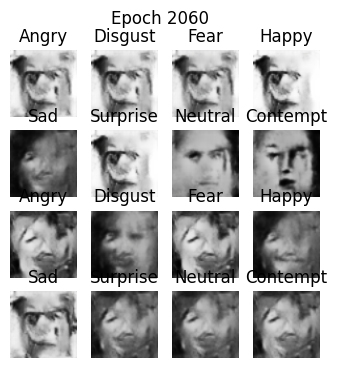

Epoch 2061/3000
  Generator loss: 1.2702 | Discriminator loss: 0.9172
Epoch 2062/3000
  Generator loss: 1.2763 | Discriminator loss: 0.9143
Epoch 2063/3000
  Generator loss: 1.2712 | Discriminator loss: 0.9160
Epoch 2064/3000
  Generator loss: 1.2810 | Discriminator loss: 0.9194
Epoch 2065/3000
  Generator loss: 1.2673 | Discriminator loss: 0.9159
  Checkpoint saved at epoch 2065.
Epoch 2066/3000
  Generator loss: 1.2770 | Discriminator loss: 0.9169
Epoch 2067/3000
  Generator loss: 1.2724 | Discriminator loss: 0.9146
Epoch 2068/3000
  Generator loss: 1.2658 | Discriminator loss: 0.9172
Epoch 2069/3000
  Generator loss: 1.2693 | Discriminator loss: 0.9150
Epoch 2070/3000
  Generator loss: 1.2697 | Discriminator loss: 0.9141
  Checkpoint saved at epoch 2070.


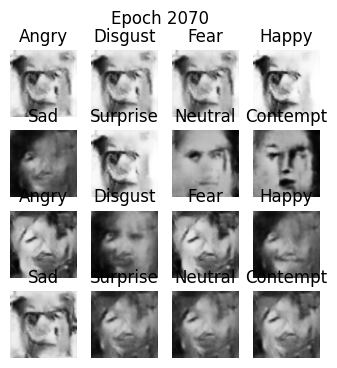

Epoch 2071/3000
  Generator loss: 1.2717 | Discriminator loss: 0.9145
Epoch 2072/3000
  Generator loss: 1.2809 | Discriminator loss: 0.9096
Epoch 2073/3000
  Generator loss: 1.2709 | Discriminator loss: 0.9167
Epoch 2074/3000
  Generator loss: 1.2763 | Discriminator loss: 0.9136
Epoch 2075/3000
  Generator loss: 1.2671 | Discriminator loss: 0.9174
  Checkpoint saved at epoch 2075.
Epoch 2076/3000
  Generator loss: 1.2731 | Discriminator loss: 0.9159
Epoch 2077/3000
  Generator loss: 1.2632 | Discriminator loss: 0.9198
Epoch 2078/3000
  Generator loss: 1.2884 | Discriminator loss: 0.9075
Epoch 2079/3000
  Generator loss: 1.2732 | Discriminator loss: 0.9159
Epoch 2080/3000
  Generator loss: 1.2688 | Discriminator loss: 0.9170
  Checkpoint saved at epoch 2080.


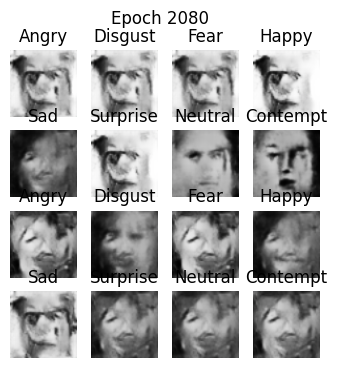

Epoch 2081/3000
  Generator loss: 1.2823 | Discriminator loss: 0.9147
Epoch 2082/3000
  Generator loss: 1.2679 | Discriminator loss: 0.9160
Epoch 2083/3000
  Generator loss: 1.2599 | Discriminator loss: 0.9201
Epoch 2084/3000
  Generator loss: 1.2724 | Discriminator loss: 0.9153
Epoch 2085/3000
  Generator loss: 1.2789 | Discriminator loss: 0.9149
  Checkpoint saved at epoch 2085.
Epoch 2086/3000
  Generator loss: 1.2812 | Discriminator loss: 0.9070
Epoch 2087/3000
  Generator loss: 1.2668 | Discriminator loss: 0.9185
Epoch 2088/3000
  Generator loss: 1.2638 | Discriminator loss: 0.9151
Epoch 2089/3000
  Generator loss: 1.2943 | Discriminator loss: 0.9083
Epoch 2090/3000
  Generator loss: 1.2751 | Discriminator loss: 0.9133
  Checkpoint saved at epoch 2090.


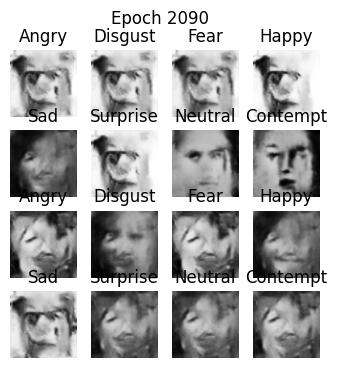

Epoch 2091/3000
  Generator loss: 1.2683 | Discriminator loss: 0.9144
Epoch 2092/3000
  Generator loss: 1.2686 | Discriminator loss: 0.9169
Epoch 2093/3000
  Generator loss: 1.2699 | Discriminator loss: 0.9156
Epoch 2094/3000
  Generator loss: 1.2960 | Discriminator loss: 0.9173
Epoch 2095/3000
  Generator loss: 1.2709 | Discriminator loss: 0.9148
  Checkpoint saved at epoch 2095.
Epoch 2096/3000
  Generator loss: 1.2760 | Discriminator loss: 0.9154
Epoch 2097/3000
  Generator loss: 1.2837 | Discriminator loss: 0.9070
Epoch 2098/3000
  Generator loss: 1.2731 | Discriminator loss: 0.9176
Epoch 2099/3000
  Generator loss: 1.2632 | Discriminator loss: 0.9172
Epoch 2100/3000
  Generator loss: 1.2877 | Discriminator loss: 0.9155
  Checkpoint saved at epoch 2100.
Training history saved at epoch 2100 to ./training_history\history_epoch_2100.pkl


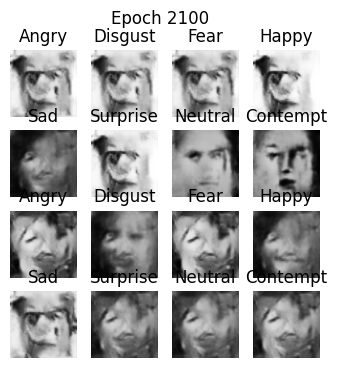

Epoch 2101/3000
  Generator loss: 1.2769 | Discriminator loss: 0.9110
Epoch 2102/3000
  Generator loss: 1.2690 | Discriminator loss: 0.9144
Epoch 2103/3000
  Generator loss: 1.2637 | Discriminator loss: 0.9188
Epoch 2104/3000
  Generator loss: 1.2792 | Discriminator loss: 0.9138
Epoch 2105/3000
  Generator loss: 1.2640 | Discriminator loss: 0.9183
  Checkpoint saved at epoch 2105.
Epoch 2106/3000
  Generator loss: 1.2694 | Discriminator loss: 0.9142
Epoch 2107/3000
  Generator loss: 1.2709 | Discriminator loss: 0.9142
Epoch 2108/3000
  Generator loss: 1.2629 | Discriminator loss: 0.9203
Epoch 2109/3000
  Generator loss: 1.2837 | Discriminator loss: 0.9172
Epoch 2110/3000
  Generator loss: 1.2751 | Discriminator loss: 0.9155
  Checkpoint saved at epoch 2110.


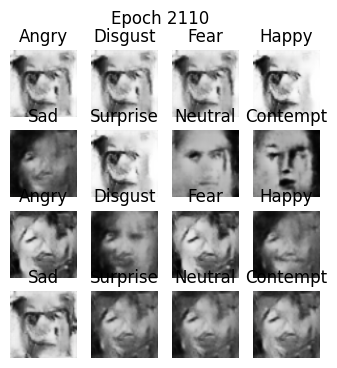

Epoch 2111/3000
  Generator loss: 1.2776 | Discriminator loss: 0.9156
Epoch 2112/3000
  Generator loss: 1.2738 | Discriminator loss: 0.9109
Epoch 2113/3000
  Generator loss: 1.2742 | Discriminator loss: 0.9150
Epoch 2114/3000
  Generator loss: 1.2749 | Discriminator loss: 0.9150
Epoch 2115/3000
  Generator loss: 1.2800 | Discriminator loss: 0.9150
  Checkpoint saved at epoch 2115.
Epoch 2116/3000
  Generator loss: 1.2748 | Discriminator loss: 0.9148
Epoch 2117/3000
  Generator loss: 1.2629 | Discriminator loss: 0.9187
Epoch 2118/3000
  Generator loss: 1.2878 | Discriminator loss: 0.9089
Epoch 2119/3000
  Generator loss: 1.2663 | Discriminator loss: 0.9160
Epoch 2120/3000
  Generator loss: 1.2720 | Discriminator loss: 0.9177
  Checkpoint saved at epoch 2120.


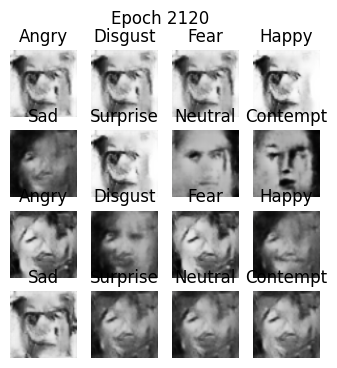

Epoch 2121/3000
  Generator loss: 1.2731 | Discriminator loss: 0.9148
Epoch 2122/3000
  Generator loss: 1.2929 | Discriminator loss: 0.9144
Epoch 2123/3000
  Generator loss: 1.2700 | Discriminator loss: 0.9173
Epoch 2124/3000
  Generator loss: 1.2662 | Discriminator loss: 0.9176
Epoch 2125/3000
  Generator loss: 1.2764 | Discriminator loss: 0.9130
  Checkpoint saved at epoch 2125.
Epoch 2126/3000
  Generator loss: 1.2753 | Discriminator loss: 0.9175
Epoch 2127/3000
  Generator loss: 1.2703 | Discriminator loss: 0.9201
Epoch 2128/3000
  Generator loss: 1.2711 | Discriminator loss: 0.9129
Epoch 2129/3000
  Generator loss: 1.2634 | Discriminator loss: 0.9180
Epoch 2130/3000
  Generator loss: 1.2708 | Discriminator loss: 0.9164
  Checkpoint saved at epoch 2130.


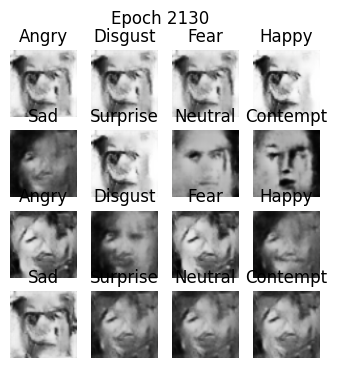

Epoch 2131/3000
  Generator loss: 1.2717 | Discriminator loss: 0.9181
Epoch 2132/3000
  Generator loss: 1.2787 | Discriminator loss: 0.9190
Epoch 2133/3000
  Generator loss: 1.2778 | Discriminator loss: 0.9125
Epoch 2134/3000
  Generator loss: 1.2842 | Discriminator loss: 0.9126
Epoch 2135/3000
  Generator loss: 1.2764 | Discriminator loss: 0.9183
  Checkpoint saved at epoch 2135.
Epoch 2136/3000
  Generator loss: 1.2735 | Discriminator loss: 0.9128
Epoch 2137/3000
  Generator loss: 1.2761 | Discriminator loss: 0.9147
Epoch 2138/3000
  Generator loss: 1.2760 | Discriminator loss: 0.9134
Epoch 2139/3000
  Generator loss: 1.2771 | Discriminator loss: 0.9143
Epoch 2140/3000
  Generator loss: 1.2720 | Discriminator loss: 0.9174
  Checkpoint saved at epoch 2140.


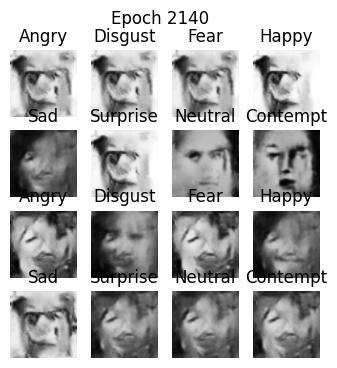

Epoch 2141/3000
  Generator loss: 1.3196 | Discriminator loss: 0.9159
Epoch 2142/3000
  Generator loss: 1.2653 | Discriminator loss: 0.9192
Epoch 2143/3000
  Generator loss: 1.2740 | Discriminator loss: 0.9167
Epoch 2144/3000
  Generator loss: 1.3016 | Discriminator loss: 0.9095
Epoch 2145/3000
  Generator loss: 1.2718 | Discriminator loss: 0.9157
  Checkpoint saved at epoch 2145.
Epoch 2146/3000
  Generator loss: 1.2667 | Discriminator loss: 0.9161
Epoch 2147/3000
  Generator loss: 1.2806 | Discriminator loss: 0.9140
Epoch 2148/3000
  Generator loss: 1.2720 | Discriminator loss: 0.9149
Epoch 2149/3000
  Generator loss: 1.2913 | Discriminator loss: 0.9101
Epoch 2150/3000
  Generator loss: 1.2688 | Discriminator loss: 0.9190
  Checkpoint saved at epoch 2150.
Training history saved at epoch 2150 to ./training_history\history_epoch_2150.pkl


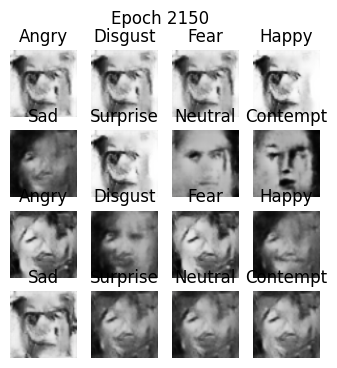

Epoch 2151/3000
  Generator loss: 1.2862 | Discriminator loss: 0.9068
Epoch 2152/3000
  Generator loss: 1.2918 | Discriminator loss: 0.9140
Epoch 2153/3000
  Generator loss: 1.2744 | Discriminator loss: 0.9118
Epoch 2154/3000
  Generator loss: 1.2792 | Discriminator loss: 0.9176
Epoch 2155/3000
  Generator loss: 1.2766 | Discriminator loss: 0.9145
  Checkpoint saved at epoch 2155.
Epoch 2156/3000
  Generator loss: 1.2698 | Discriminator loss: 0.9220
Epoch 2157/3000
  Generator loss: 1.2704 | Discriminator loss: 0.9142
Epoch 2158/3000
  Generator loss: 1.2730 | Discriminator loss: 0.9142
Epoch 2159/3000
  Generator loss: 1.2901 | Discriminator loss: 0.9104
Epoch 2160/3000
  Generator loss: 1.2703 | Discriminator loss: 0.9153
  Checkpoint saved at epoch 2160.


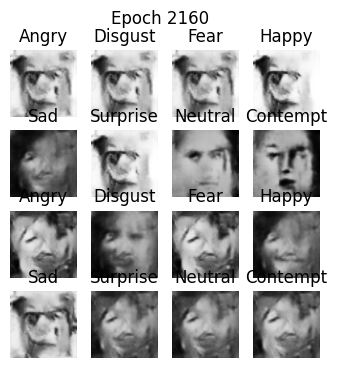

Epoch 2161/3000
  Generator loss: 1.2732 | Discriminator loss: 0.9127
Epoch 2162/3000
  Generator loss: 1.2774 | Discriminator loss: 0.9113
Epoch 2163/3000
  Generator loss: 1.2586 | Discriminator loss: 0.9173
Epoch 2164/3000
  Generator loss: 1.2670 | Discriminator loss: 0.9172
Epoch 2165/3000
  Generator loss: 1.2688 | Discriminator loss: 0.9178
  Checkpoint saved at epoch 2165.
Epoch 2166/3000
  Generator loss: 1.2742 | Discriminator loss: 0.9112
Epoch 2167/3000
  Generator loss: 1.2837 | Discriminator loss: 0.9121
Epoch 2168/3000
  Generator loss: 1.2645 | Discriminator loss: 0.9193
Epoch 2169/3000
  Generator loss: 1.2630 | Discriminator loss: 0.9224
Epoch 2170/3000
  Generator loss: 1.2704 | Discriminator loss: 0.9167
  Checkpoint saved at epoch 2170.


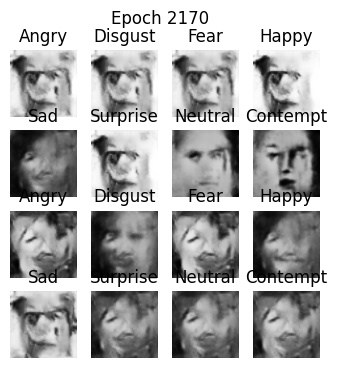

Epoch 2171/3000
  Generator loss: 1.2717 | Discriminator loss: 0.9149
Epoch 2172/3000
  Generator loss: 1.2744 | Discriminator loss: 0.9180
Epoch 2173/3000
  Generator loss: 1.2751 | Discriminator loss: 0.9153
Epoch 2174/3000
  Generator loss: 1.2658 | Discriminator loss: 0.9167
Epoch 2175/3000
  Generator loss: 1.2745 | Discriminator loss: 0.9143
  Checkpoint saved at epoch 2175.
Epoch 2176/3000
  Generator loss: 1.2800 | Discriminator loss: 0.9139
Epoch 2177/3000
  Generator loss: 1.2794 | Discriminator loss: 0.9124
Epoch 2178/3000
  Generator loss: 1.2676 | Discriminator loss: 0.9185
Epoch 2179/3000
  Generator loss: 1.2739 | Discriminator loss: 0.9155
Epoch 2180/3000
  Generator loss: 1.2627 | Discriminator loss: 0.9200
  Checkpoint saved at epoch 2180.


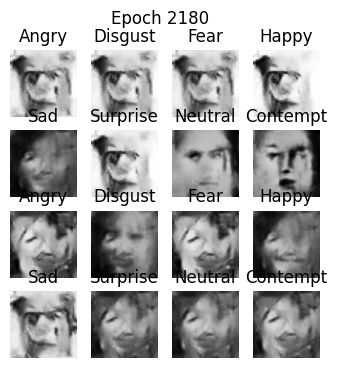

Epoch 2181/3000
  Generator loss: 1.2690 | Discriminator loss: 0.9212
Epoch 2182/3000
  Generator loss: 1.2796 | Discriminator loss: 0.9138
Epoch 2183/3000
  Generator loss: 1.2780 | Discriminator loss: 0.9093
Epoch 2184/3000
  Generator loss: 1.2675 | Discriminator loss: 0.9193
Epoch 2185/3000
  Generator loss: 1.2775 | Discriminator loss: 0.9128
  Checkpoint saved at epoch 2185.
Epoch 2186/3000
  Generator loss: 1.2676 | Discriminator loss: 0.9197
Epoch 2187/3000
  Generator loss: 1.2594 | Discriminator loss: 0.9186
Epoch 2188/3000
  Generator loss: 1.2675 | Discriminator loss: 0.9179
Epoch 2189/3000
  Generator loss: 1.2627 | Discriminator loss: 0.9180
Epoch 2190/3000
  Generator loss: 1.2782 | Discriminator loss: 0.9093
  Checkpoint saved at epoch 2190.


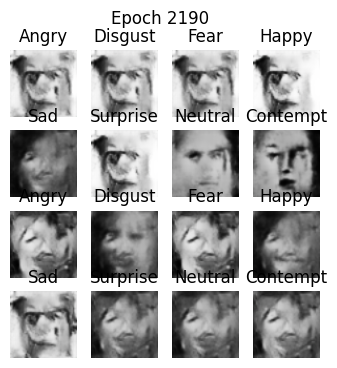

Epoch 2191/3000
  Generator loss: 1.2656 | Discriminator loss: 0.9178
Epoch 2192/3000
  Generator loss: 1.2732 | Discriminator loss: 0.9183
Epoch 2193/3000
  Generator loss: 1.2762 | Discriminator loss: 0.9157
Epoch 2194/3000
  Generator loss: 1.2686 | Discriminator loss: 0.9181
Epoch 2195/3000
  Generator loss: 1.2710 | Discriminator loss: 0.9191
  Checkpoint saved at epoch 2195.
Epoch 2196/3000
  Generator loss: 1.2743 | Discriminator loss: 0.9133
Epoch 2197/3000
  Generator loss: 1.2651 | Discriminator loss: 0.9242
Epoch 2198/3000
  Generator loss: 1.2775 | Discriminator loss: 0.9136
Epoch 2199/3000
  Generator loss: 1.2664 | Discriminator loss: 0.9188
Epoch 2200/3000
  Generator loss: 1.2528 | Discriminator loss: 0.9183
  Checkpoint saved at epoch 2200.
Training history saved at epoch 2200 to ./training_history\history_epoch_2200.pkl


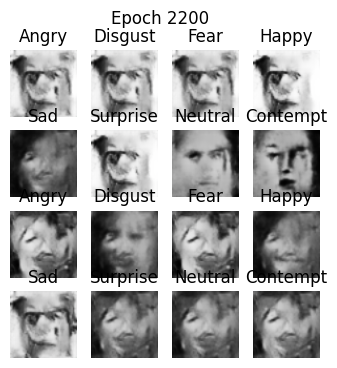

Epoch 2201/3000
  Generator loss: 1.2860 | Discriminator loss: 0.9120
Epoch 2202/3000
  Generator loss: 1.2743 | Discriminator loss: 0.9156
Epoch 2203/3000
  Generator loss: 1.2767 | Discriminator loss: 0.9145
Epoch 2204/3000
  Generator loss: 1.2680 | Discriminator loss: 0.9209
Epoch 2205/3000
  Generator loss: 1.2775 | Discriminator loss: 0.9158
  Checkpoint saved at epoch 2205.
Epoch 2206/3000
  Generator loss: 1.2709 | Discriminator loss: 0.9148
Epoch 2207/3000
  Generator loss: 1.2693 | Discriminator loss: 0.9200
Epoch 2208/3000
  Generator loss: 1.2739 | Discriminator loss: 0.9141
Epoch 2209/3000
  Generator loss: 1.2684 | Discriminator loss: 0.9181
Epoch 2210/3000
  Generator loss: 1.2684 | Discriminator loss: 0.9188
  Checkpoint saved at epoch 2210.


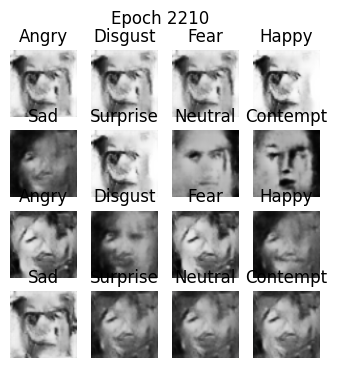

Epoch 2211/3000
  Generator loss: 1.2636 | Discriminator loss: 0.9180
Epoch 2212/3000
  Generator loss: 1.2769 | Discriminator loss: 0.9106
Epoch 2213/3000
  Generator loss: 1.2746 | Discriminator loss: 0.9116
Epoch 2214/3000
  Generator loss: 1.2876 | Discriminator loss: 0.9117
Epoch 2215/3000
  Generator loss: 1.2928 | Discriminator loss: 0.9129
  Checkpoint saved at epoch 2215.
Epoch 2216/3000
  Generator loss: 1.2749 | Discriminator loss: 0.9118
Epoch 2217/3000
  Generator loss: 1.2732 | Discriminator loss: 0.9219
Epoch 2218/3000
  Generator loss: 1.2746 | Discriminator loss: 0.9160
Epoch 2219/3000
  Generator loss: 1.3019 | Discriminator loss: 0.9133
Epoch 2220/3000
  Generator loss: 1.2673 | Discriminator loss: 0.9163
  Checkpoint saved at epoch 2220.


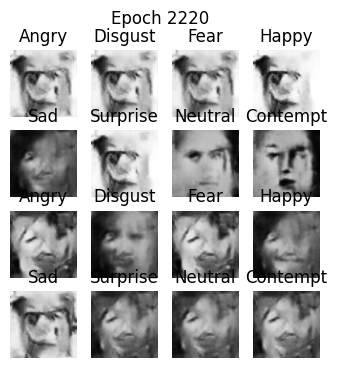

Epoch 2221/3000
  Generator loss: 1.2749 | Discriminator loss: 0.9147
Epoch 2222/3000
  Generator loss: 1.2816 | Discriminator loss: 0.9115
Epoch 2223/3000
  Generator loss: 1.2845 | Discriminator loss: 0.9105
Epoch 2224/3000
  Generator loss: 1.2893 | Discriminator loss: 0.9066
Epoch 2225/3000
  Generator loss: 1.2863 | Discriminator loss: 0.9194
  Checkpoint saved at epoch 2225.
Epoch 2226/3000
  Generator loss: 1.2700 | Discriminator loss: 0.9191
Epoch 2227/3000
  Generator loss: 1.2836 | Discriminator loss: 0.9141
Epoch 2228/3000
  Generator loss: 1.2808 | Discriminator loss: 0.9177
Epoch 2229/3000
  Generator loss: 1.2636 | Discriminator loss: 0.9162
Epoch 2230/3000
  Generator loss: 1.2688 | Discriminator loss: 0.9185
  Checkpoint saved at epoch 2230.


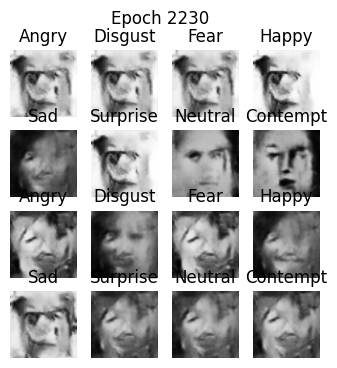

Epoch 2231/3000
  Generator loss: 1.2722 | Discriminator loss: 0.9151
Epoch 2232/3000
  Generator loss: 1.2773 | Discriminator loss: 0.9186
Epoch 2233/3000
  Generator loss: 1.2824 | Discriminator loss: 0.9131
Epoch 2234/3000
  Generator loss: 1.2760 | Discriminator loss: 0.9137
Epoch 2235/3000
  Generator loss: 1.2730 | Discriminator loss: 0.9170
  Checkpoint saved at epoch 2235.
Epoch 2236/3000
  Generator loss: 1.2743 | Discriminator loss: 0.9160
Epoch 2237/3000
  Generator loss: 1.2642 | Discriminator loss: 0.9213
Epoch 2238/3000
  Generator loss: 1.2760 | Discriminator loss: 0.9098
Epoch 2239/3000
  Generator loss: 1.3112 | Discriminator loss: 0.9216
Epoch 2240/3000
  Generator loss: 1.2717 | Discriminator loss: 0.9200
  Checkpoint saved at epoch 2240.


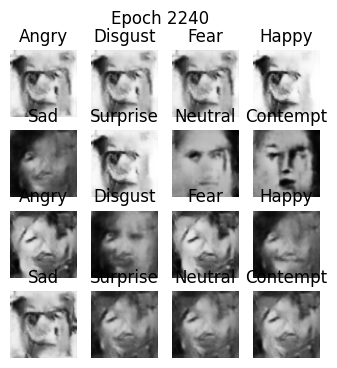

Epoch 2241/3000
  Generator loss: 1.2711 | Discriminator loss: 0.9158
Epoch 2242/3000
  Generator loss: 1.2736 | Discriminator loss: 0.9133
Epoch 2243/3000
  Generator loss: 1.2639 | Discriminator loss: 0.9190
Epoch 2244/3000
  Generator loss: 1.2796 | Discriminator loss: 0.9142
Epoch 2245/3000
  Generator loss: 1.2671 | Discriminator loss: 0.9159
  Checkpoint saved at epoch 2245.
Epoch 2246/3000
  Generator loss: 1.2715 | Discriminator loss: 0.9182
Epoch 2247/3000
  Generator loss: 1.2851 | Discriminator loss: 0.9106
Epoch 2248/3000
  Generator loss: 1.2850 | Discriminator loss: 0.9096
Epoch 2249/3000
  Generator loss: 1.2749 | Discriminator loss: 0.9134
Epoch 2250/3000
  Generator loss: 1.2814 | Discriminator loss: 0.9145
  Checkpoint saved at epoch 2250.
Training history saved at epoch 2250 to ./training_history\history_epoch_2250.pkl


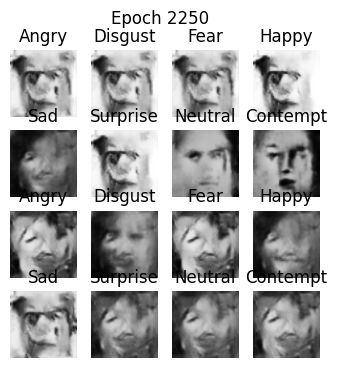

Epoch 2251/3000
  Generator loss: 1.2641 | Discriminator loss: 0.9173
Epoch 2252/3000
  Generator loss: 1.2674 | Discriminator loss: 0.9159
Epoch 2253/3000
  Generator loss: 1.2847 | Discriminator loss: 0.9172
Epoch 2254/3000
  Generator loss: 1.2829 | Discriminator loss: 0.9104
Epoch 2255/3000
  Generator loss: 1.2748 | Discriminator loss: 0.9143
  Checkpoint saved at epoch 2255.
Epoch 2256/3000
  Generator loss: 1.2867 | Discriminator loss: 0.9117
Epoch 2257/3000
  Generator loss: 1.2737 | Discriminator loss: 0.9113
Epoch 2258/3000
  Generator loss: 1.2718 | Discriminator loss: 0.9116
Epoch 2259/3000
  Generator loss: 1.2727 | Discriminator loss: 0.9141
Epoch 2260/3000
  Generator loss: 1.2829 | Discriminator loss: 0.9139
  Checkpoint saved at epoch 2260.


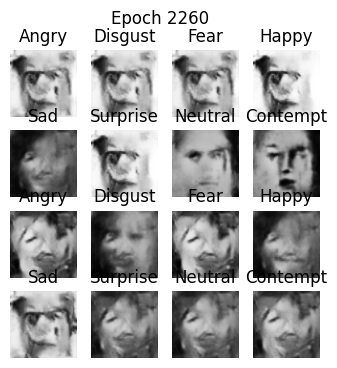

Epoch 2261/3000
  Generator loss: 1.2694 | Discriminator loss: 0.9139
Epoch 2262/3000
  Generator loss: 1.2646 | Discriminator loss: 0.9150
Epoch 2263/3000
  Generator loss: 1.2718 | Discriminator loss: 0.9161
Epoch 2264/3000
  Generator loss: 1.2782 | Discriminator loss: 0.9132
Epoch 2265/3000
  Generator loss: 1.2630 | Discriminator loss: 0.9179
  Checkpoint saved at epoch 2265.
Epoch 2266/3000
  Generator loss: 1.2807 | Discriminator loss: 0.9093
Epoch 2267/3000
  Generator loss: 1.2911 | Discriminator loss: 0.9088
Epoch 2268/3000
  Generator loss: 1.2627 | Discriminator loss: 0.9189
Epoch 2269/3000
  Generator loss: 1.2553 | Discriminator loss: 0.9225
Epoch 2270/3000
  Generator loss: 1.2712 | Discriminator loss: 0.9172
  Checkpoint saved at epoch 2270.


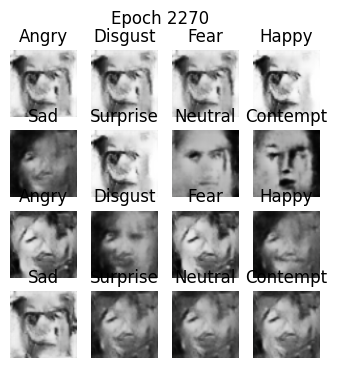

Epoch 2271/3000
  Generator loss: 1.3465 | Discriminator loss: 0.9176
Epoch 2272/3000
  Generator loss: 1.2774 | Discriminator loss: 0.9148
Epoch 2273/3000
  Generator loss: 1.2697 | Discriminator loss: 0.9179
Epoch 2274/3000
  Generator loss: 1.2763 | Discriminator loss: 0.9145
Epoch 2275/3000
  Generator loss: 1.2692 | Discriminator loss: 0.9166
  Checkpoint saved at epoch 2275.
Epoch 2276/3000
  Generator loss: 1.2698 | Discriminator loss: 0.9182
Epoch 2277/3000
  Generator loss: 1.2774 | Discriminator loss: 0.9171
Epoch 2278/3000
  Generator loss: 1.2696 | Discriminator loss: 0.9139
Epoch 2279/3000
  Generator loss: 1.2711 | Discriminator loss: 0.9156
Epoch 2280/3000
  Generator loss: 1.2687 | Discriminator loss: 0.9157
  Checkpoint saved at epoch 2280.


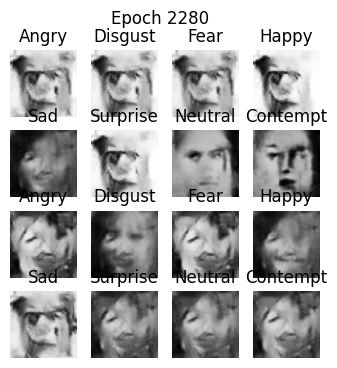

Epoch 2281/3000
  Generator loss: 1.2702 | Discriminator loss: 0.9189
Epoch 2282/3000
  Generator loss: 1.3013 | Discriminator loss: 0.9109
Epoch 2283/3000
  Generator loss: 1.2695 | Discriminator loss: 0.9171
Epoch 2284/3000
  Generator loss: 1.2685 | Discriminator loss: 0.9190
Epoch 2285/3000
  Generator loss: 1.2765 | Discriminator loss: 0.9092
  Checkpoint saved at epoch 2285.
Epoch 2286/3000
  Generator loss: 1.2832 | Discriminator loss: 0.9138
Epoch 2287/3000
  Generator loss: 1.2870 | Discriminator loss: 0.9151
Epoch 2288/3000
  Generator loss: 1.2627 | Discriminator loss: 0.9224
Epoch 2289/3000
  Generator loss: 1.2724 | Discriminator loss: 0.9184
Epoch 2290/3000
  Generator loss: 1.2698 | Discriminator loss: 0.9146
  Checkpoint saved at epoch 2290.


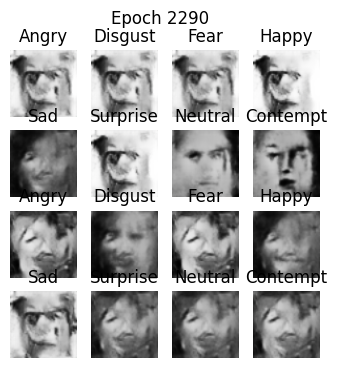

Epoch 2291/3000
  Generator loss: 1.2709 | Discriminator loss: 0.9204
Epoch 2292/3000
  Generator loss: 1.2630 | Discriminator loss: 0.9207
Epoch 2293/3000
  Generator loss: 1.2664 | Discriminator loss: 0.9204
Epoch 2294/3000
  Generator loss: 1.2741 | Discriminator loss: 0.9166
Epoch 2295/3000
  Generator loss: 1.2736 | Discriminator loss: 0.9179
  Checkpoint saved at epoch 2295.
Epoch 2296/3000
  Generator loss: 1.2857 | Discriminator loss: 0.9100
Epoch 2297/3000
  Generator loss: 1.2756 | Discriminator loss: 0.9132
Epoch 2298/3000
  Generator loss: 1.2689 | Discriminator loss: 0.9152
Epoch 2299/3000
  Generator loss: 1.2878 | Discriminator loss: 0.9126
Epoch 2300/3000
  Generator loss: 1.2793 | Discriminator loss: 0.9131
  Checkpoint saved at epoch 2300.
Training history saved at epoch 2300 to ./training_history\history_epoch_2300.pkl


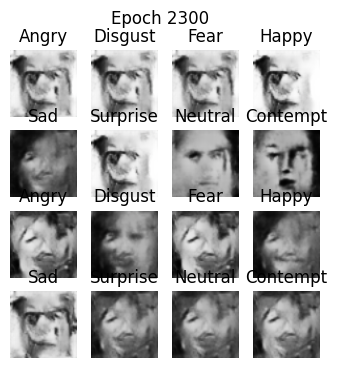

Epoch 2301/3000
  Generator loss: 1.2670 | Discriminator loss: 0.9184
Epoch 2302/3000
  Generator loss: 1.2801 | Discriminator loss: 0.9095
Epoch 2303/3000
  Generator loss: 1.2793 | Discriminator loss: 0.9135
Epoch 2304/3000
  Generator loss: 1.2696 | Discriminator loss: 0.9126
Epoch 2305/3000
  Generator loss: 1.2868 | Discriminator loss: 0.9063
  Checkpoint saved at epoch 2305.
Epoch 2306/3000
  Generator loss: 1.2704 | Discriminator loss: 0.9195
Epoch 2307/3000
  Generator loss: 1.2677 | Discriminator loss: 0.9193
Epoch 2308/3000
  Generator loss: 1.2872 | Discriminator loss: 0.9114
Epoch 2309/3000
  Generator loss: 1.2858 | Discriminator loss: 0.9125
Epoch 2310/3000
  Generator loss: 1.2741 | Discriminator loss: 0.9133
  Checkpoint saved at epoch 2310.


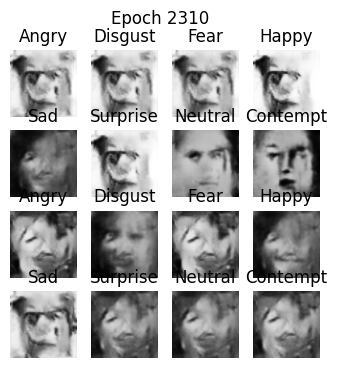

Epoch 2311/3000
  Generator loss: 1.2794 | Discriminator loss: 0.9111
Epoch 2312/3000
  Generator loss: 1.2726 | Discriminator loss: 0.9146
Epoch 2313/3000
  Generator loss: 1.2728 | Discriminator loss: 0.9135
Epoch 2314/3000
  Generator loss: 1.2809 | Discriminator loss: 0.9136
Epoch 2315/3000
  Generator loss: 1.2729 | Discriminator loss: 0.9152
  Checkpoint saved at epoch 2315.
Epoch 2316/3000
  Generator loss: 1.2756 | Discriminator loss: 0.9150
Epoch 2317/3000
  Generator loss: 1.2654 | Discriminator loss: 0.9175
Epoch 2318/3000
  Generator loss: 1.2700 | Discriminator loss: 0.9141
Epoch 2319/3000
  Generator loss: 1.2795 | Discriminator loss: 0.9134
Epoch 2320/3000
  Generator loss: 1.2730 | Discriminator loss: 0.9203
  Checkpoint saved at epoch 2320.


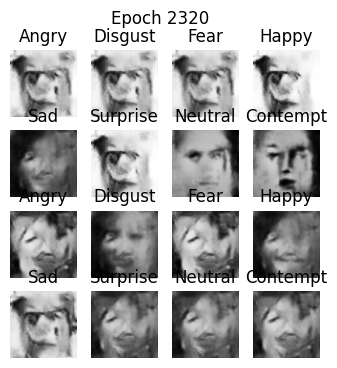

Epoch 2321/3000
  Generator loss: 1.2715 | Discriminator loss: 0.9156
Epoch 2322/3000
  Generator loss: 1.2764 | Discriminator loss: 0.9103
Epoch 2323/3000
  Generator loss: 1.2714 | Discriminator loss: 0.9173
Epoch 2324/3000
  Generator loss: 1.2787 | Discriminator loss: 0.9158
Epoch 2325/3000
  Generator loss: 1.2745 | Discriminator loss: 0.9167
  Checkpoint saved at epoch 2325.
Epoch 2326/3000
  Generator loss: 1.2717 | Discriminator loss: 0.9140
Epoch 2327/3000
  Generator loss: 1.2682 | Discriminator loss: 0.9170
Epoch 2328/3000
  Generator loss: 1.2665 | Discriminator loss: 0.9187
Epoch 2329/3000
  Generator loss: 1.2701 | Discriminator loss: 0.9180
Epoch 2330/3000
  Generator loss: 1.2754 | Discriminator loss: 0.9134
  Checkpoint saved at epoch 2330.


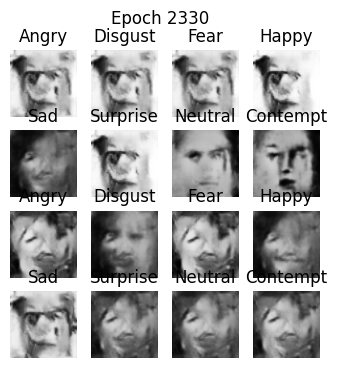

Epoch 2331/3000
  Generator loss: 1.2752 | Discriminator loss: 0.9102
Epoch 2332/3000
  Generator loss: 1.2753 | Discriminator loss: 0.9129
Epoch 2333/3000
  Generator loss: 1.2701 | Discriminator loss: 0.9168
Epoch 2334/3000
  Generator loss: 1.2719 | Discriminator loss: 0.9144
Epoch 2335/3000
  Generator loss: 1.2854 | Discriminator loss: 0.9116
  Checkpoint saved at epoch 2335.
Epoch 2336/3000
  Generator loss: 1.2659 | Discriminator loss: 0.9169
Epoch 2337/3000
  Generator loss: 1.2674 | Discriminator loss: 0.9203
Epoch 2338/3000
  Generator loss: 1.2831 | Discriminator loss: 0.9135
Epoch 2339/3000
  Generator loss: 1.2649 | Discriminator loss: 0.9198
Epoch 2340/3000
  Generator loss: 1.2666 | Discriminator loss: 0.9165
  Checkpoint saved at epoch 2340.


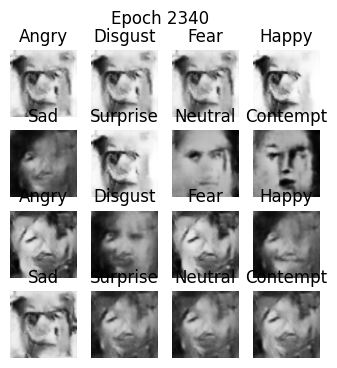

Epoch 2341/3000
  Generator loss: 1.2695 | Discriminator loss: 0.9186
Epoch 2342/3000
  Generator loss: 1.2763 | Discriminator loss: 0.9139
Epoch 2343/3000
  Generator loss: 1.2843 | Discriminator loss: 0.9120
Epoch 2344/3000
  Generator loss: 1.2786 | Discriminator loss: 0.9122
Epoch 2345/3000
  Generator loss: 1.2947 | Discriminator loss: 0.9104
  Checkpoint saved at epoch 2345.
Epoch 2346/3000
  Generator loss: 1.2686 | Discriminator loss: 0.9169
Epoch 2347/3000
  Generator loss: 1.2790 | Discriminator loss: 0.9122
Epoch 2348/3000
  Generator loss: 1.2708 | Discriminator loss: 0.9144
Epoch 2349/3000
  Generator loss: 1.2718 | Discriminator loss: 0.9155
Epoch 2350/3000
  Generator loss: 1.2612 | Discriminator loss: 0.9192
  Checkpoint saved at epoch 2350.
Training history saved at epoch 2350 to ./training_history\history_epoch_2350.pkl


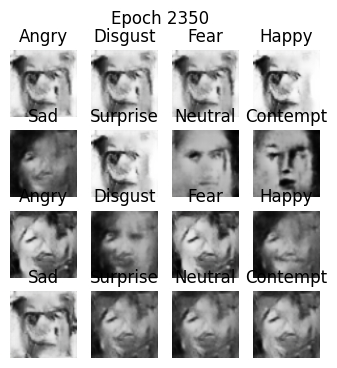

Epoch 2351/3000
  Generator loss: 1.2801 | Discriminator loss: 0.9102
Epoch 2352/3000
  Generator loss: 1.2806 | Discriminator loss: 0.9088
Epoch 2353/3000
  Generator loss: 1.2718 | Discriminator loss: 0.9166
Epoch 2354/3000
  Generator loss: 1.2670 | Discriminator loss: 0.9202
Epoch 2355/3000
  Generator loss: 1.2760 | Discriminator loss: 0.9127
  Checkpoint saved at epoch 2355.
Epoch 2356/3000
  Generator loss: 1.2627 | Discriminator loss: 0.9234
Epoch 2357/3000
  Generator loss: 1.2967 | Discriminator loss: 0.9178
Epoch 2358/3000
  Generator loss: 1.2805 | Discriminator loss: 0.9113
Epoch 2359/3000
  Generator loss: 1.2689 | Discriminator loss: 0.9182
Epoch 2360/3000
  Generator loss: 1.2724 | Discriminator loss: 0.9159
  Checkpoint saved at epoch 2360.


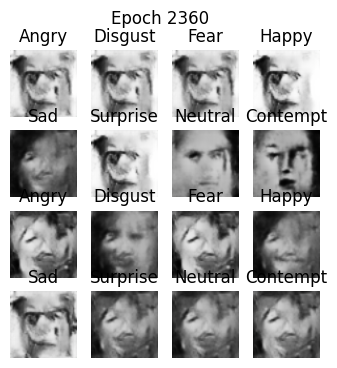

Epoch 2361/3000
  Generator loss: 1.2754 | Discriminator loss: 0.9145
Epoch 2362/3000
  Generator loss: 1.3012 | Discriminator loss: 0.9113
Epoch 2363/3000
  Generator loss: 1.2694 | Discriminator loss: 0.9190
Epoch 2364/3000
  Generator loss: 1.3159 | Discriminator loss: 0.9143
Epoch 2365/3000
  Generator loss: 1.2702 | Discriminator loss: 0.9194
  Checkpoint saved at epoch 2365.
Epoch 2366/3000
  Generator loss: 1.2698 | Discriminator loss: 0.9170
Epoch 2367/3000
  Generator loss: 1.2767 | Discriminator loss: 0.9177
Epoch 2368/3000
  Generator loss: 1.2849 | Discriminator loss: 0.9102
Epoch 2369/3000
  Generator loss: 1.2733 | Discriminator loss: 0.9133
Epoch 2370/3000
  Generator loss: 1.2784 | Discriminator loss: 0.9138
  Checkpoint saved at epoch 2370.


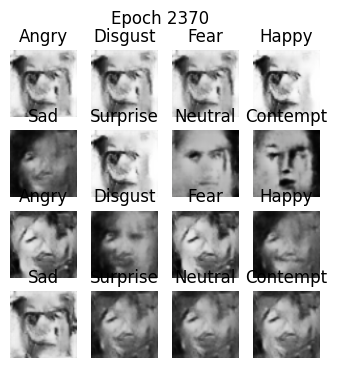

Epoch 2371/3000
  Generator loss: 1.2778 | Discriminator loss: 0.9107
Epoch 2372/3000
  Generator loss: 1.2813 | Discriminator loss: 0.9118
Epoch 2373/3000
  Generator loss: 1.2795 | Discriminator loss: 0.9154
Epoch 2374/3000
  Generator loss: 1.2672 | Discriminator loss: 0.9183
Epoch 2375/3000
  Generator loss: 1.2780 | Discriminator loss: 0.9128
  Checkpoint saved at epoch 2375.
Epoch 2376/3000
  Generator loss: 1.2706 | Discriminator loss: 0.9159
Epoch 2377/3000
  Generator loss: 1.2776 | Discriminator loss: 0.9137
Epoch 2378/3000
  Generator loss: 1.2679 | Discriminator loss: 0.9129
Epoch 2379/3000
  Generator loss: 1.2822 | Discriminator loss: 0.9145
Epoch 2380/3000
  Generator loss: 1.2664 | Discriminator loss: 0.9177
  Checkpoint saved at epoch 2380.


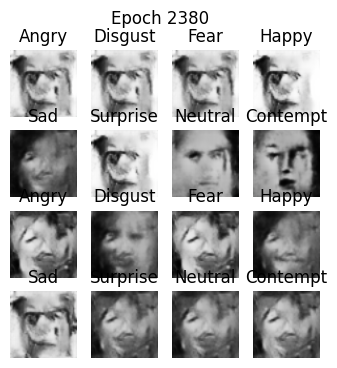

Epoch 2381/3000
  Generator loss: 1.2908 | Discriminator loss: 0.9060
Epoch 2382/3000
  Generator loss: 1.2684 | Discriminator loss: 0.9173
Epoch 2383/3000
  Generator loss: 1.2771 | Discriminator loss: 0.9166
Epoch 2384/3000
  Generator loss: 1.2818 | Discriminator loss: 0.9132
Epoch 2385/3000
  Generator loss: 1.2765 | Discriminator loss: 0.9171
  Checkpoint saved at epoch 2385.
Epoch 2386/3000
  Generator loss: 1.2963 | Discriminator loss: 0.9115
Epoch 2387/3000
  Generator loss: 1.2834 | Discriminator loss: 0.9126
Epoch 2388/3000
  Generator loss: 1.3046 | Discriminator loss: 0.9145
Epoch 2389/3000
  Generator loss: 1.2755 | Discriminator loss: 0.9155
Epoch 2390/3000
  Generator loss: 1.2697 | Discriminator loss: 0.9182
  Checkpoint saved at epoch 2390.


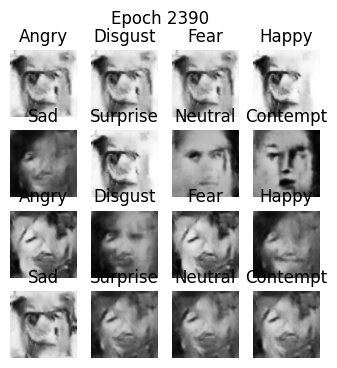

Epoch 2391/3000
  Generator loss: 1.2668 | Discriminator loss: 0.9188
Epoch 2392/3000
  Generator loss: 1.2730 | Discriminator loss: 0.9166
Epoch 2393/3000
  Generator loss: 1.2827 | Discriminator loss: 0.9127
Epoch 2394/3000
  Generator loss: 1.2661 | Discriminator loss: 0.9189
Epoch 2395/3000
  Generator loss: 1.2684 | Discriminator loss: 0.9185
  Checkpoint saved at epoch 2395.
Epoch 2396/3000
  Generator loss: 1.2676 | Discriminator loss: 0.9206
Epoch 2397/3000
  Generator loss: 1.2830 | Discriminator loss: 0.9066
Epoch 2398/3000
  Generator loss: 1.2952 | Discriminator loss: 0.9157
Epoch 2399/3000
  Generator loss: 1.2760 | Discriminator loss: 0.9134
Epoch 2400/3000
  Generator loss: 1.2713 | Discriminator loss: 0.9135
  Checkpoint saved at epoch 2400.
Training history saved at epoch 2400 to ./training_history\history_epoch_2400.pkl


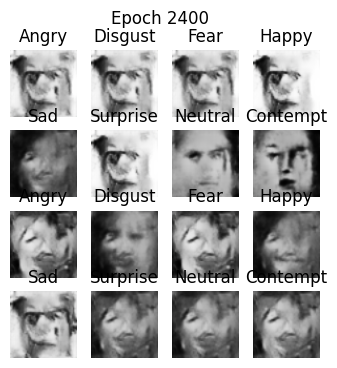

Epoch 2401/3000
  Generator loss: 1.2720 | Discriminator loss: 0.9173
Epoch 2402/3000
  Generator loss: 1.2650 | Discriminator loss: 0.9209
Epoch 2403/3000
  Generator loss: 1.2753 | Discriminator loss: 0.9145
Epoch 2404/3000
  Generator loss: 1.2765 | Discriminator loss: 0.9119
Epoch 2405/3000
  Generator loss: 1.2638 | Discriminator loss: 0.9225
  Checkpoint saved at epoch 2405.
Epoch 2406/3000
  Generator loss: 1.2780 | Discriminator loss: 0.9157
Epoch 2407/3000
  Generator loss: 1.2875 | Discriminator loss: 0.9103
Epoch 2408/3000
  Generator loss: 1.2827 | Discriminator loss: 0.9226
Epoch 2409/3000
  Generator loss: 1.2674 | Discriminator loss: 0.9212
Epoch 2410/3000
  Generator loss: 1.2940 | Discriminator loss: 0.9087
  Checkpoint saved at epoch 2410.


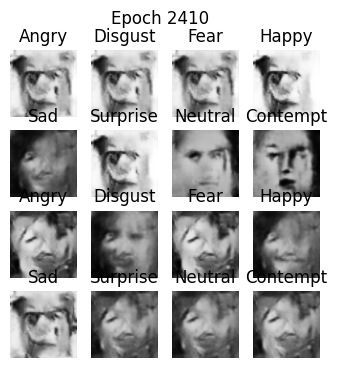

Epoch 2411/3000
  Generator loss: 1.2729 | Discriminator loss: 0.9130
Epoch 2412/3000
  Generator loss: 1.2698 | Discriminator loss: 0.9167
Epoch 2413/3000
  Generator loss: 1.2673 | Discriminator loss: 0.9153
Epoch 2414/3000
  Generator loss: 1.2706 | Discriminator loss: 0.9107
Epoch 2415/3000
  Generator loss: 1.2977 | Discriminator loss: 0.9151
  Checkpoint saved at epoch 2415.
Epoch 2416/3000
  Generator loss: 1.2764 | Discriminator loss: 0.9118
Epoch 2417/3000
  Generator loss: 1.2748 | Discriminator loss: 0.9121
Epoch 2418/3000
  Generator loss: 1.2850 | Discriminator loss: 0.9129
Epoch 2419/3000
  Generator loss: 1.2669 | Discriminator loss: 0.9204
Epoch 2420/3000
  Generator loss: 1.2670 | Discriminator loss: 0.9148
  Checkpoint saved at epoch 2420.


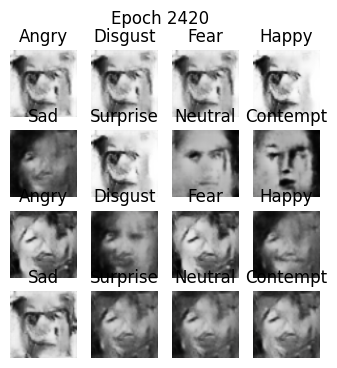

Epoch 2421/3000
  Generator loss: 1.2899 | Discriminator loss: 0.9105
Epoch 2422/3000
  Generator loss: 1.3058 | Discriminator loss: 0.9187
Epoch 2423/3000
  Generator loss: 1.2901 | Discriminator loss: 0.9068
Epoch 2424/3000
  Generator loss: 1.2716 | Discriminator loss: 0.9159
Epoch 2425/3000
  Generator loss: 1.2949 | Discriminator loss: 0.9127
  Checkpoint saved at epoch 2425.
Epoch 2426/3000
  Generator loss: 1.2782 | Discriminator loss: 0.9170
Epoch 2427/3000
  Generator loss: 1.2653 | Discriminator loss: 0.9161
Epoch 2428/3000
  Generator loss: 1.2601 | Discriminator loss: 0.9220
Epoch 2429/3000
  Generator loss: 1.2698 | Discriminator loss: 0.9185
Epoch 2430/3000
  Generator loss: 1.2857 | Discriminator loss: 0.9128
  Checkpoint saved at epoch 2430.


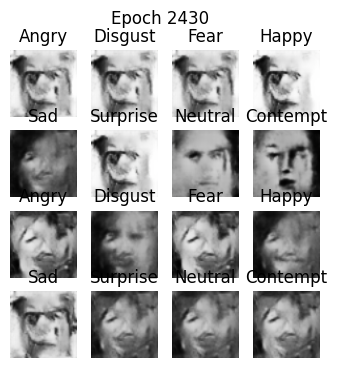

Epoch 2431/3000
  Generator loss: 1.2743 | Discriminator loss: 0.9158
Epoch 2432/3000
  Generator loss: 1.2643 | Discriminator loss: 0.9194
Epoch 2433/3000
  Generator loss: 1.2969 | Discriminator loss: 0.9097
Epoch 2434/3000
  Generator loss: 1.2718 | Discriminator loss: 0.9190
Epoch 2435/3000
  Generator loss: 1.2706 | Discriminator loss: 0.9136
  Checkpoint saved at epoch 2435.
Epoch 2436/3000
  Generator loss: 1.2779 | Discriminator loss: 0.9191
Epoch 2437/3000
  Generator loss: 1.2906 | Discriminator loss: 0.9114
Epoch 2438/3000
  Generator loss: 1.2701 | Discriminator loss: 0.9131
Epoch 2439/3000
  Generator loss: 1.2618 | Discriminator loss: 0.9192
Epoch 2440/3000
  Generator loss: 1.2678 | Discriminator loss: 0.9160
  Checkpoint saved at epoch 2440.


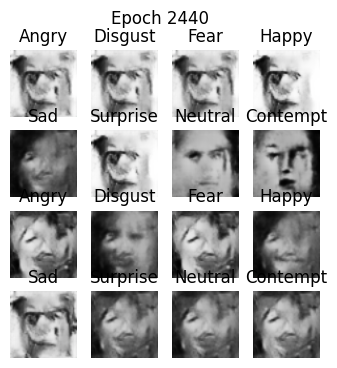

Epoch 2441/3000
  Generator loss: 1.2712 | Discriminator loss: 0.9197
Epoch 2442/3000
  Generator loss: 1.2597 | Discriminator loss: 0.9184
Epoch 2443/3000
  Generator loss: 1.2650 | Discriminator loss: 0.9189
Epoch 2444/3000
  Generator loss: 1.2677 | Discriminator loss: 0.9210
Epoch 2445/3000
  Generator loss: 1.2733 | Discriminator loss: 0.9129
  Checkpoint saved at epoch 2445.
Epoch 2446/3000
  Generator loss: 1.2970 | Discriminator loss: 0.9085
Epoch 2447/3000
  Generator loss: 1.2732 | Discriminator loss: 0.9185
Epoch 2448/3000
  Generator loss: 1.2803 | Discriminator loss: 0.9139
Epoch 2449/3000
  Generator loss: 1.2716 | Discriminator loss: 0.9155
Epoch 2450/3000
  Generator loss: 1.2771 | Discriminator loss: 0.9149
  Checkpoint saved at epoch 2450.
Training history saved at epoch 2450 to ./training_history\history_epoch_2450.pkl


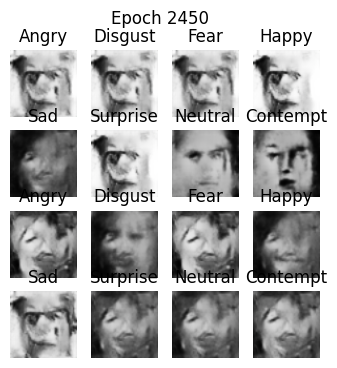

Epoch 2451/3000
  Generator loss: 1.2709 | Discriminator loss: 0.9168
Epoch 2452/3000
  Generator loss: 1.2711 | Discriminator loss: 0.9161
Epoch 2453/3000
  Generator loss: 1.2702 | Discriminator loss: 0.9159
Epoch 2454/3000
  Generator loss: 1.2702 | Discriminator loss: 0.9162
Epoch 2455/3000
  Generator loss: 1.2710 | Discriminator loss: 0.9162
  Checkpoint saved at epoch 2455.
Epoch 2456/3000
  Generator loss: 1.2579 | Discriminator loss: 0.9268
Epoch 2457/3000
  Generator loss: 1.2736 | Discriminator loss: 0.9196
Epoch 2458/3000
  Generator loss: 1.2694 | Discriminator loss: 0.9184
Epoch 2459/3000
  Generator loss: 1.2778 | Discriminator loss: 0.9121
Epoch 2460/3000
  Generator loss: 1.2690 | Discriminator loss: 0.9187
  Checkpoint saved at epoch 2460.


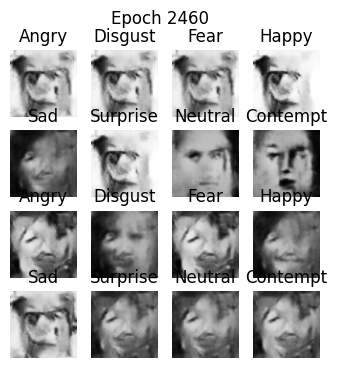

Epoch 2461/3000
  Generator loss: 1.2677 | Discriminator loss: 0.9188
Epoch 2462/3000
  Generator loss: 1.2663 | Discriminator loss: 0.9166
Epoch 2463/3000
  Generator loss: 1.2768 | Discriminator loss: 0.9145
Epoch 2464/3000
  Generator loss: 1.2810 | Discriminator loss: 0.9132
Epoch 2465/3000
  Generator loss: 1.2760 | Discriminator loss: 0.9119
  Checkpoint saved at epoch 2465.
Epoch 2466/3000
  Generator loss: 1.2841 | Discriminator loss: 0.9113
Epoch 2467/3000
  Generator loss: 1.2590 | Discriminator loss: 0.9177
Epoch 2468/3000
  Generator loss: 1.2631 | Discriminator loss: 0.9189
Epoch 2469/3000
  Generator loss: 1.2759 | Discriminator loss: 0.9087
Epoch 2470/3000
  Generator loss: 1.2672 | Discriminator loss: 0.9175
  Checkpoint saved at epoch 2470.


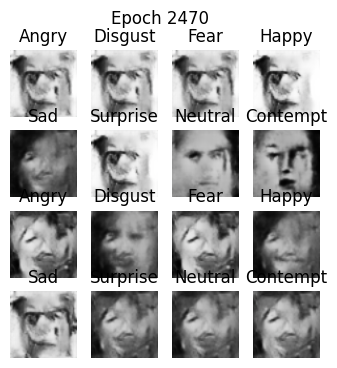

Epoch 2471/3000
  Generator loss: 1.2743 | Discriminator loss: 0.9157
Epoch 2472/3000
  Generator loss: 1.2715 | Discriminator loss: 0.9171
Epoch 2473/3000
  Generator loss: 1.2678 | Discriminator loss: 0.9165
Epoch 2474/3000
  Generator loss: 1.2871 | Discriminator loss: 0.9109
Epoch 2475/3000
  Generator loss: 1.2779 | Discriminator loss: 0.9121
  Checkpoint saved at epoch 2475.
Epoch 2476/3000
  Generator loss: 1.2711 | Discriminator loss: 0.9147
Epoch 2477/3000
  Generator loss: 1.2813 | Discriminator loss: 0.9164
Epoch 2478/3000
  Generator loss: 1.2705 | Discriminator loss: 0.9163
Epoch 2479/3000
  Generator loss: 1.2707 | Discriminator loss: 0.9152
Epoch 2480/3000
  Generator loss: 1.2782 | Discriminator loss: 0.9102
  Checkpoint saved at epoch 2480.


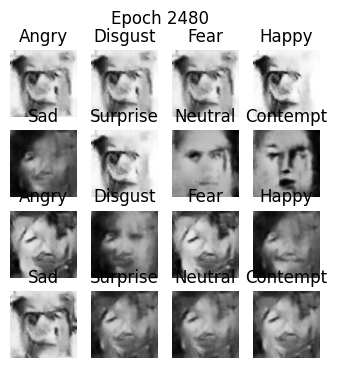

Epoch 2481/3000
  Generator loss: 1.2683 | Discriminator loss: 0.9170
Epoch 2482/3000
  Generator loss: 1.2779 | Discriminator loss: 0.9118
Epoch 2483/3000
  Generator loss: 1.2886 | Discriminator loss: 0.9118
Epoch 2484/3000
  Generator loss: 1.2687 | Discriminator loss: 0.9166
Epoch 2485/3000
  Generator loss: 1.2706 | Discriminator loss: 0.9138
  Checkpoint saved at epoch 2485.
Epoch 2486/3000
  Generator loss: 1.2730 | Discriminator loss: 0.9139
Epoch 2487/3000
  Generator loss: 1.2732 | Discriminator loss: 0.9137
Epoch 2488/3000
  Generator loss: 1.2732 | Discriminator loss: 0.9165
Epoch 2489/3000
  Generator loss: 1.2783 | Discriminator loss: 0.9136
Epoch 2490/3000
  Generator loss: 1.2743 | Discriminator loss: 0.9170
  Checkpoint saved at epoch 2490.


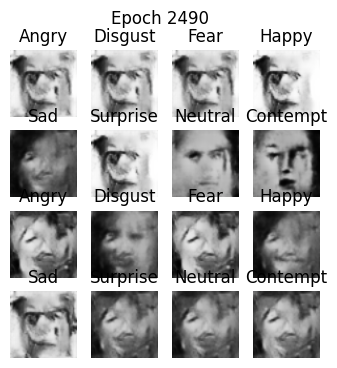

Epoch 2491/3000
  Generator loss: 1.3012 | Discriminator loss: 0.9132
Epoch 2492/3000
  Generator loss: 1.2738 | Discriminator loss: 0.9160
Epoch 2493/3000
  Generator loss: 1.2682 | Discriminator loss: 0.9158
Epoch 2494/3000
  Generator loss: 1.2794 | Discriminator loss: 0.9134
Epoch 2495/3000
  Generator loss: 1.2798 | Discriminator loss: 0.9147
  Checkpoint saved at epoch 2495.
Epoch 2496/3000
  Generator loss: 1.2714 | Discriminator loss: 0.9164
Epoch 2497/3000
  Generator loss: 1.2640 | Discriminator loss: 0.9206
Epoch 2498/3000
  Generator loss: 1.2637 | Discriminator loss: 0.9207
Epoch 2499/3000
  Generator loss: 1.2746 | Discriminator loss: 0.9118
Epoch 2500/3000
  Generator loss: 1.2779 | Discriminator loss: 0.9106
  Checkpoint saved at epoch 2500.
Training history saved at epoch 2500 to ./training_history\history_epoch_2500.pkl


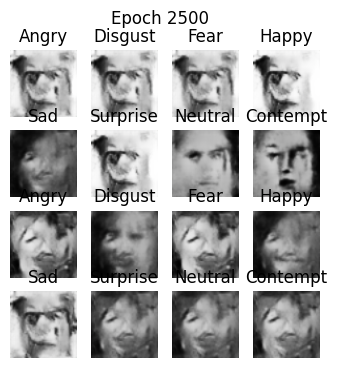

Epoch 2501/3000
  Generator loss: 1.2781 | Discriminator loss: 0.9114
Epoch 2502/3000
  Generator loss: 1.2633 | Discriminator loss: 0.9162
Epoch 2503/3000
  Generator loss: 1.2843 | Discriminator loss: 0.9072
Epoch 2504/3000
  Generator loss: 1.2703 | Discriminator loss: 0.9190
Epoch 2505/3000
  Generator loss: 1.2677 | Discriminator loss: 0.9200
  Checkpoint saved at epoch 2505.
Epoch 2506/3000
  Generator loss: 1.2711 | Discriminator loss: 0.9153
Epoch 2507/3000
  Generator loss: 1.2778 | Discriminator loss: 0.9145
Epoch 2508/3000
  Generator loss: 1.2797 | Discriminator loss: 0.9151
Epoch 2509/3000
  Generator loss: 1.2792 | Discriminator loss: 0.9171
Epoch 2510/3000
  Generator loss: 1.2803 | Discriminator loss: 0.9178
  Checkpoint saved at epoch 2510.


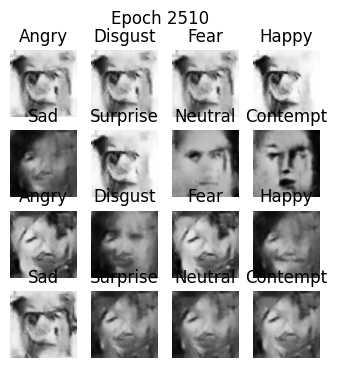

Epoch 2511/3000
  Generator loss: 1.2759 | Discriminator loss: 0.9155
Epoch 2512/3000
  Generator loss: 1.2827 | Discriminator loss: 0.9142
Epoch 2513/3000
  Generator loss: 1.2684 | Discriminator loss: 0.9192
Epoch 2514/3000
  Generator loss: 1.2749 | Discriminator loss: 0.9175
Epoch 2515/3000
  Generator loss: 1.2641 | Discriminator loss: 0.9203
  Checkpoint saved at epoch 2515.
Epoch 2516/3000
  Generator loss: 1.2675 | Discriminator loss: 0.9161
Epoch 2517/3000
  Generator loss: 1.2689 | Discriminator loss: 0.9151
Epoch 2518/3000
  Generator loss: 1.2731 | Discriminator loss: 0.9138
Epoch 2519/3000
  Generator loss: 1.2733 | Discriminator loss: 0.9154
Epoch 2520/3000
  Generator loss: 1.2683 | Discriminator loss: 0.9170
  Checkpoint saved at epoch 2520.


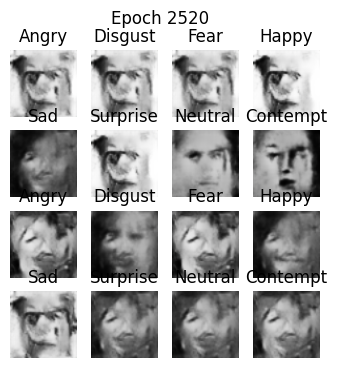

Epoch 2521/3000
  Generator loss: 1.2673 | Discriminator loss: 0.9173
Epoch 2522/3000
  Generator loss: 1.2738 | Discriminator loss: 0.9163
Epoch 2523/3000
  Generator loss: 1.2628 | Discriminator loss: 0.9164
Epoch 2524/3000
  Generator loss: 1.2710 | Discriminator loss: 0.9212
Epoch 2525/3000
  Generator loss: 1.2843 | Discriminator loss: 0.9130
  Checkpoint saved at epoch 2525.
Epoch 2526/3000
  Generator loss: 1.2659 | Discriminator loss: 0.9142
Epoch 2527/3000
  Generator loss: 1.2696 | Discriminator loss: 0.9139
Epoch 2528/3000
  Generator loss: 1.2724 | Discriminator loss: 0.9138
Epoch 2529/3000
  Generator loss: 1.2686 | Discriminator loss: 0.9176
Epoch 2530/3000
  Generator loss: 1.2715 | Discriminator loss: 0.9182
  Checkpoint saved at epoch 2530.


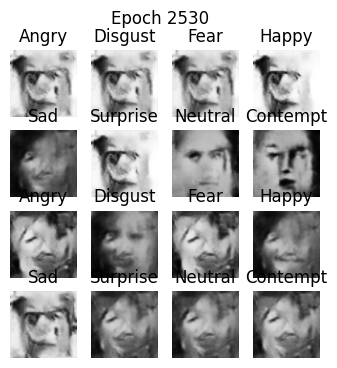

Epoch 2531/3000
  Generator loss: 1.2746 | Discriminator loss: 0.9129
Epoch 2532/3000
  Generator loss: 1.2672 | Discriminator loss: 0.9171
Epoch 2533/3000
  Generator loss: 1.2810 | Discriminator loss: 0.9100
Epoch 2534/3000
  Generator loss: 1.2759 | Discriminator loss: 0.9131
Epoch 2535/3000
  Generator loss: 1.2729 | Discriminator loss: 0.9149
  Checkpoint saved at epoch 2535.
Epoch 2536/3000
  Generator loss: 1.2715 | Discriminator loss: 0.9162
Epoch 2537/3000
  Generator loss: 1.2838 | Discriminator loss: 0.9118
Epoch 2538/3000
  Generator loss: 1.2625 | Discriminator loss: 0.9183
Epoch 2539/3000
  Generator loss: 1.2750 | Discriminator loss: 0.9128
Epoch 2540/3000
  Generator loss: 1.2746 | Discriminator loss: 0.9141
  Checkpoint saved at epoch 2540.


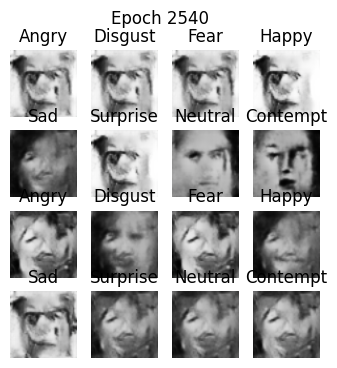

Epoch 2541/3000
  Generator loss: 1.2704 | Discriminator loss: 0.9155
Epoch 2542/3000
  Generator loss: 1.2760 | Discriminator loss: 0.9147
Epoch 2543/3000
  Generator loss: 1.2811 | Discriminator loss: 0.9143
Epoch 2544/3000
  Generator loss: 1.2664 | Discriminator loss: 0.9157
Epoch 2545/3000
  Generator loss: 1.2635 | Discriminator loss: 0.9189
  Checkpoint saved at epoch 2545.
Epoch 2546/3000
  Generator loss: 1.2938 | Discriminator loss: 0.9108
Epoch 2547/3000
  Generator loss: 1.2674 | Discriminator loss: 0.9194
Epoch 2548/3000
  Generator loss: 1.2927 | Discriminator loss: 0.9103
Epoch 2549/3000
  Generator loss: 1.2689 | Discriminator loss: 0.9153
Epoch 2550/3000
  Generator loss: 1.2780 | Discriminator loss: 0.9136
  Checkpoint saved at epoch 2550.
Training history saved at epoch 2550 to ./training_history\history_epoch_2550.pkl


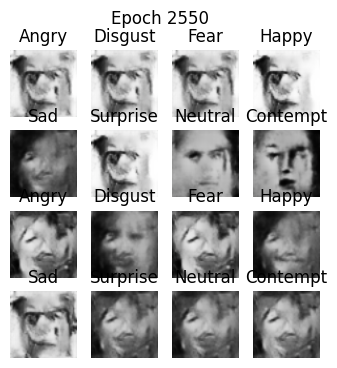

Epoch 2551/3000
  Generator loss: 1.2764 | Discriminator loss: 0.9089
Epoch 2552/3000
  Generator loss: 1.2889 | Discriminator loss: 0.9172
Epoch 2553/3000
  Generator loss: 1.2661 | Discriminator loss: 0.9175
Epoch 2554/3000
  Generator loss: 1.2786 | Discriminator loss: 0.9146
Epoch 2555/3000
  Generator loss: 1.2735 | Discriminator loss: 0.9160
  Checkpoint saved at epoch 2555.
Epoch 2556/3000
  Generator loss: 1.2637 | Discriminator loss: 0.9181
Epoch 2557/3000
  Generator loss: 1.2781 | Discriminator loss: 0.9126
Epoch 2558/3000
  Generator loss: 1.2740 | Discriminator loss: 0.9115
Epoch 2559/3000
  Generator loss: 1.2677 | Discriminator loss: 0.9167
Epoch 2560/3000
  Generator loss: 1.2745 | Discriminator loss: 0.9126
  Checkpoint saved at epoch 2560.


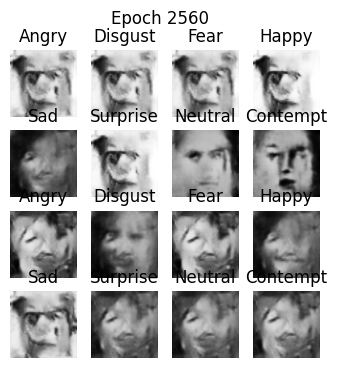

Epoch 2561/3000
  Generator loss: 1.2633 | Discriminator loss: 0.9169
Epoch 2562/3000
  Generator loss: 1.2658 | Discriminator loss: 0.9181
Epoch 2563/3000
  Generator loss: 1.2706 | Discriminator loss: 0.9152
Epoch 2564/3000
  Generator loss: 1.2687 | Discriminator loss: 0.9160
Epoch 2565/3000
  Generator loss: 1.2885 | Discriminator loss: 0.9122
  Checkpoint saved at epoch 2565.
Epoch 2566/3000
  Generator loss: 1.2726 | Discriminator loss: 0.9126
Epoch 2567/3000
  Generator loss: 1.2610 | Discriminator loss: 0.9210
Epoch 2568/3000
  Generator loss: 1.2696 | Discriminator loss: 0.9200
Epoch 2569/3000
  Generator loss: 1.2859 | Discriminator loss: 0.9089
Epoch 2570/3000
  Generator loss: 1.2770 | Discriminator loss: 0.9151
  Checkpoint saved at epoch 2570.


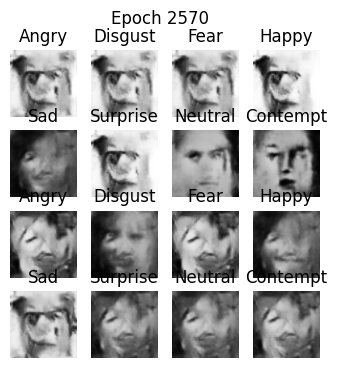

Epoch 2571/3000
  Generator loss: 1.2704 | Discriminator loss: 0.9187
Epoch 2572/3000
  Generator loss: 1.2791 | Discriminator loss: 0.9133
Epoch 2573/3000
  Generator loss: 1.2661 | Discriminator loss: 0.9211
Epoch 2574/3000
  Generator loss: 1.2698 | Discriminator loss: 0.9187
Epoch 2575/3000
  Generator loss: 1.2780 | Discriminator loss: 0.9159
  Checkpoint saved at epoch 2575.
Epoch 2576/3000
  Generator loss: 1.2750 | Discriminator loss: 0.9170
Epoch 2577/3000
  Generator loss: 1.2775 | Discriminator loss: 0.9162
Epoch 2578/3000
  Generator loss: 1.2646 | Discriminator loss: 0.9170
Epoch 2579/3000
  Generator loss: 1.2672 | Discriminator loss: 0.9164
Epoch 2580/3000
  Generator loss: 1.2734 | Discriminator loss: 0.9147
  Checkpoint saved at epoch 2580.


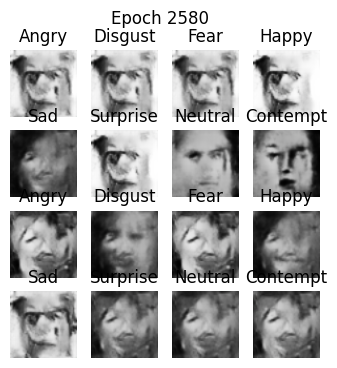

Epoch 2581/3000
  Generator loss: 1.2689 | Discriminator loss: 0.9203
Epoch 2582/3000
  Generator loss: 1.2597 | Discriminator loss: 0.9168
Epoch 2583/3000
  Generator loss: 1.2675 | Discriminator loss: 0.9169
Epoch 2584/3000
  Generator loss: 1.2677 | Discriminator loss: 0.9136
Epoch 2585/3000
  Generator loss: 1.2663 | Discriminator loss: 0.9184
  Checkpoint saved at epoch 2585.
Epoch 2586/3000
  Generator loss: 1.2632 | Discriminator loss: 0.9191
Epoch 2587/3000
  Generator loss: 1.2835 | Discriminator loss: 0.9108
Epoch 2588/3000
  Generator loss: 1.2797 | Discriminator loss: 0.9134
Epoch 2589/3000
  Generator loss: 1.2699 | Discriminator loss: 0.9241
Epoch 2590/3000
  Generator loss: 1.2645 | Discriminator loss: 0.9168
  Checkpoint saved at epoch 2590.


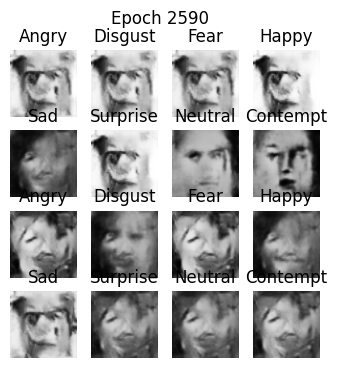

Epoch 2591/3000
  Generator loss: 1.2746 | Discriminator loss: 0.9105
Epoch 2592/3000
  Generator loss: 1.2716 | Discriminator loss: 0.9212
Epoch 2593/3000
  Generator loss: 1.2720 | Discriminator loss: 0.9188
Epoch 2594/3000
  Generator loss: 1.2677 | Discriminator loss: 0.9189
Epoch 2595/3000
  Generator loss: 1.2650 | Discriminator loss: 0.9183
  Checkpoint saved at epoch 2595.
Epoch 2596/3000
  Generator loss: 1.2783 | Discriminator loss: 0.9121
Epoch 2597/3000
  Generator loss: 1.2891 | Discriminator loss: 0.9119
Epoch 2598/3000
  Generator loss: 1.2990 | Discriminator loss: 0.9123
Epoch 2599/3000
  Generator loss: 1.2781 | Discriminator loss: 0.9152
Epoch 2600/3000
  Generator loss: 1.2755 | Discriminator loss: 0.9139
  Checkpoint saved at epoch 2600.
Training history saved at epoch 2600 to ./training_history\history_epoch_2600.pkl


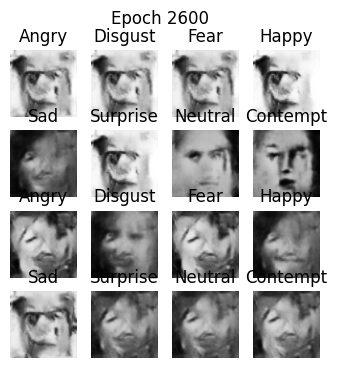

Epoch 2601/3000
  Generator loss: 1.2791 | Discriminator loss: 0.9120
Epoch 2602/3000
  Generator loss: 1.2913 | Discriminator loss: 0.9099
Epoch 2603/3000
  Generator loss: 1.2771 | Discriminator loss: 0.9137
Epoch 2604/3000
  Generator loss: 1.2626 | Discriminator loss: 0.9226
Epoch 2605/3000
  Generator loss: 1.2850 | Discriminator loss: 0.9138
  Checkpoint saved at epoch 2605.
Epoch 2606/3000
  Generator loss: 1.2838 | Discriminator loss: 0.9155
Epoch 2607/3000
  Generator loss: 1.2856 | Discriminator loss: 0.9102
Epoch 2608/3000
  Generator loss: 1.2710 | Discriminator loss: 0.9180
Epoch 2609/3000
  Generator loss: 1.2756 | Discriminator loss: 0.9104
Epoch 2610/3000
  Generator loss: 1.2710 | Discriminator loss: 0.9153
  Checkpoint saved at epoch 2610.


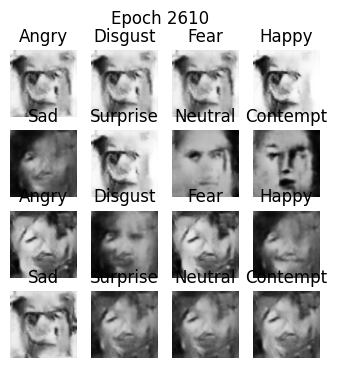

Epoch 2611/3000
  Generator loss: 1.2743 | Discriminator loss: 0.9156
Epoch 2612/3000
  Generator loss: 1.2767 | Discriminator loss: 0.9134
Epoch 2613/3000
  Generator loss: 1.2813 | Discriminator loss: 0.9087
Epoch 2614/3000
  Generator loss: 1.2781 | Discriminator loss: 0.9135
Epoch 2615/3000
  Generator loss: 1.2959 | Discriminator loss: 0.9115
  Checkpoint saved at epoch 2615.
Epoch 2616/3000
  Generator loss: 1.2716 | Discriminator loss: 0.9186
Epoch 2617/3000
  Generator loss: 1.2676 | Discriminator loss: 0.9178
Epoch 2618/3000
  Generator loss: 1.2662 | Discriminator loss: 0.9178
Epoch 2619/3000
  Generator loss: 1.2749 | Discriminator loss: 0.9133
Epoch 2620/3000
  Generator loss: 1.2799 | Discriminator loss: 0.9105
  Checkpoint saved at epoch 2620.


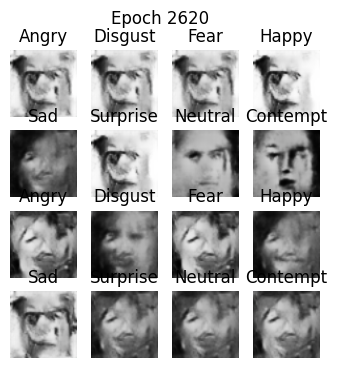

Epoch 2621/3000
  Generator loss: 1.2694 | Discriminator loss: 0.9105
Epoch 2622/3000
  Generator loss: 1.2829 | Discriminator loss: 0.9141
Epoch 2623/3000
  Generator loss: 1.2676 | Discriminator loss: 0.9199
Epoch 2624/3000
  Generator loss: 1.2897 | Discriminator loss: 0.9098
Epoch 2625/3000
  Generator loss: 1.2713 | Discriminator loss: 0.9144
  Checkpoint saved at epoch 2625.
Epoch 2626/3000
  Generator loss: 1.2710 | Discriminator loss: 0.9160
Epoch 2627/3000
  Generator loss: 1.2723 | Discriminator loss: 0.9140
Epoch 2628/3000
  Generator loss: 1.2686 | Discriminator loss: 0.9148
Epoch 2629/3000
  Generator loss: 1.2854 | Discriminator loss: 0.9174
Epoch 2630/3000
  Generator loss: 1.2724 | Discriminator loss: 0.9168
  Checkpoint saved at epoch 2630.


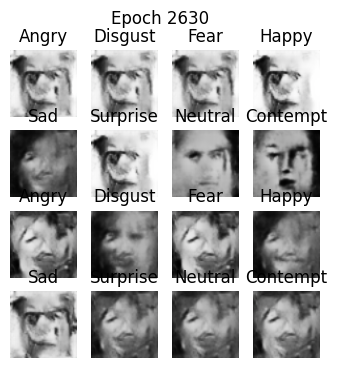

Epoch 2631/3000
  Generator loss: 1.2650 | Discriminator loss: 0.9197
Epoch 2632/3000
  Generator loss: 1.2855 | Discriminator loss: 0.9108
Epoch 2633/3000
  Generator loss: 1.2716 | Discriminator loss: 0.9155
Epoch 2634/3000
  Generator loss: 1.2714 | Discriminator loss: 0.9138
Epoch 2635/3000
  Generator loss: 1.2781 | Discriminator loss: 0.9130
  Checkpoint saved at epoch 2635.
Epoch 2636/3000
  Generator loss: 1.2647 | Discriminator loss: 0.9218
Epoch 2637/3000
  Generator loss: 1.2637 | Discriminator loss: 0.9172
Epoch 2638/3000
  Generator loss: 1.2854 | Discriminator loss: 0.9125
Epoch 2639/3000
  Generator loss: 1.3096 | Discriminator loss: 0.9111
Epoch 2640/3000
  Generator loss: 1.2651 | Discriminator loss: 0.9221
  Checkpoint saved at epoch 2640.


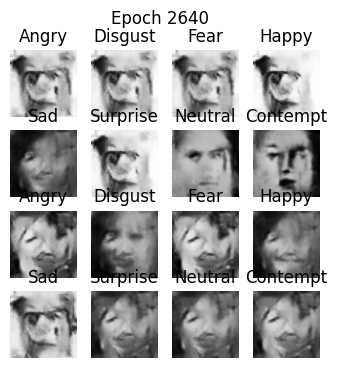

Epoch 2641/3000
  Generator loss: 1.2686 | Discriminator loss: 0.9129
Epoch 2642/3000
  Generator loss: 1.2795 | Discriminator loss: 0.9134
Epoch 2643/3000
  Generator loss: 1.2683 | Discriminator loss: 0.9170
Epoch 2644/3000
  Generator loss: 1.2713 | Discriminator loss: 0.9200
Epoch 2645/3000
  Generator loss: 1.2596 | Discriminator loss: 0.9218
  Checkpoint saved at epoch 2645.
Epoch 2646/3000
  Generator loss: 1.2590 | Discriminator loss: 0.9149
Epoch 2647/3000
  Generator loss: 1.2651 | Discriminator loss: 0.9213
Epoch 2648/3000
  Generator loss: 1.2731 | Discriminator loss: 0.9186
Epoch 2649/3000
  Generator loss: 1.2683 | Discriminator loss: 0.9168
Epoch 2650/3000
  Generator loss: 1.2808 | Discriminator loss: 0.9141
  Checkpoint saved at epoch 2650.
Training history saved at epoch 2650 to ./training_history\history_epoch_2650.pkl


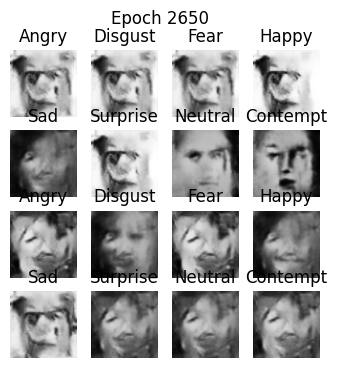

Epoch 2651/3000
  Generator loss: 1.2910 | Discriminator loss: 0.9149
Epoch 2652/3000
  Generator loss: 1.2755 | Discriminator loss: 0.9127
Epoch 2653/3000
  Generator loss: 1.2803 | Discriminator loss: 0.9144
Epoch 2654/3000
  Generator loss: 1.2717 | Discriminator loss: 0.9136
Epoch 2655/3000
  Generator loss: 1.2779 | Discriminator loss: 0.9181
  Checkpoint saved at epoch 2655.
Epoch 2656/3000
  Generator loss: 1.2710 | Discriminator loss: 0.9160
Epoch 2657/3000
  Generator loss: 1.2788 | Discriminator loss: 0.9136
Epoch 2658/3000
  Generator loss: 1.2799 | Discriminator loss: 0.9165
Epoch 2659/3000
  Generator loss: 1.2770 | Discriminator loss: 0.9129
Epoch 2660/3000
  Generator loss: 1.2637 | Discriminator loss: 0.9179
  Checkpoint saved at epoch 2660.


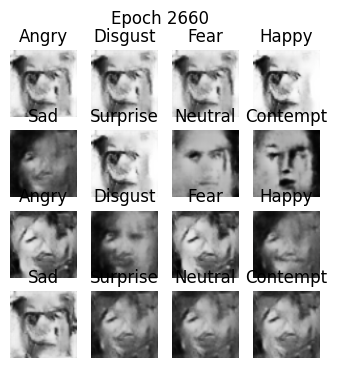

Epoch 2661/3000
  Generator loss: 1.2963 | Discriminator loss: 0.9127
Epoch 2662/3000
  Generator loss: 1.2720 | Discriminator loss: 0.9138
Epoch 2663/3000
  Generator loss: 1.2759 | Discriminator loss: 0.9144
Epoch 2664/3000
  Generator loss: 1.2681 | Discriminator loss: 0.9127
Epoch 2665/3000
  Generator loss: 1.2899 | Discriminator loss: 0.9097
  Checkpoint saved at epoch 2665.
Epoch 2666/3000
  Generator loss: 1.2854 | Discriminator loss: 0.9141
Epoch 2667/3000
  Generator loss: 1.2709 | Discriminator loss: 0.9149
Epoch 2668/3000
  Generator loss: 1.2783 | Discriminator loss: 0.9116
Epoch 2669/3000
  Generator loss: 1.2694 | Discriminator loss: 0.9167
Epoch 2670/3000
  Generator loss: 1.2767 | Discriminator loss: 0.9165
  Checkpoint saved at epoch 2670.


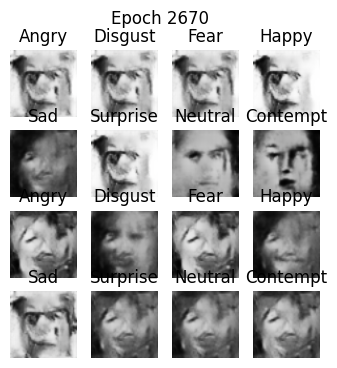

Epoch 2671/3000
  Generator loss: 1.2732 | Discriminator loss: 0.9152
Epoch 2672/3000
  Generator loss: 1.2771 | Discriminator loss: 0.9126
Epoch 2673/3000
  Generator loss: 1.2732 | Discriminator loss: 0.9129
Epoch 2674/3000
  Generator loss: 1.2689 | Discriminator loss: 0.9187
Epoch 2675/3000
  Generator loss: 1.2704 | Discriminator loss: 0.9170
  Checkpoint saved at epoch 2675.
Epoch 2676/3000
  Generator loss: 1.2662 | Discriminator loss: 0.9200
Epoch 2677/3000
  Generator loss: 1.2742 | Discriminator loss: 0.9156
Epoch 2678/3000
  Generator loss: 1.2646 | Discriminator loss: 0.9194
Epoch 2679/3000
  Generator loss: 1.2779 | Discriminator loss: 0.9127
Epoch 2680/3000
  Generator loss: 1.2709 | Discriminator loss: 0.9123
  Checkpoint saved at epoch 2680.


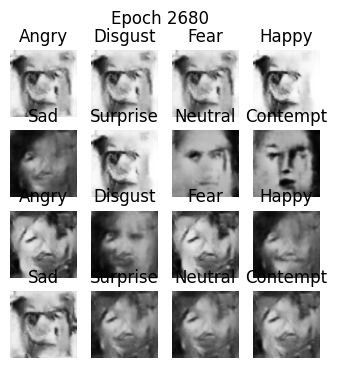

Epoch 2681/3000
  Generator loss: 1.2704 | Discriminator loss: 0.9145
Epoch 2682/3000
  Generator loss: 1.2715 | Discriminator loss: 0.9170
Epoch 2683/3000
  Generator loss: 1.2686 | Discriminator loss: 0.9183
Epoch 2684/3000
  Generator loss: 1.2628 | Discriminator loss: 0.9167
Epoch 2685/3000
  Generator loss: 1.2710 | Discriminator loss: 0.9169
  Checkpoint saved at epoch 2685.
Epoch 2686/3000
  Generator loss: 1.2625 | Discriminator loss: 0.9173
Epoch 2687/3000
  Generator loss: 1.2718 | Discriminator loss: 0.9121
Epoch 2688/3000
  Generator loss: 1.2683 | Discriminator loss: 0.9138
Epoch 2689/3000
  Generator loss: 1.2744 | Discriminator loss: 0.9137
Epoch 2690/3000
  Generator loss: 1.2686 | Discriminator loss: 0.9162
  Checkpoint saved at epoch 2690.


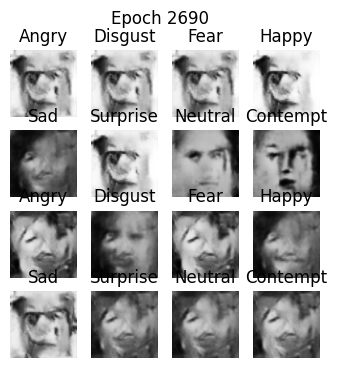

Epoch 2691/3000
  Generator loss: 1.2787 | Discriminator loss: 0.9170
Epoch 2692/3000
  Generator loss: 1.2809 | Discriminator loss: 0.9149
Epoch 2693/3000
  Generator loss: 1.2713 | Discriminator loss: 0.9223
Epoch 2694/3000
  Generator loss: 1.2704 | Discriminator loss: 0.9185
Epoch 2695/3000
  Generator loss: 1.2720 | Discriminator loss: 0.9151
  Checkpoint saved at epoch 2695.
Epoch 2696/3000
  Generator loss: 1.2855 | Discriminator loss: 0.9183
Epoch 2697/3000
  Generator loss: 1.2806 | Discriminator loss: 0.9152
Epoch 2698/3000
  Generator loss: 1.2658 | Discriminator loss: 0.9186
Epoch 2699/3000
  Generator loss: 1.2770 | Discriminator loss: 0.9154
Epoch 2700/3000
  Generator loss: 1.2967 | Discriminator loss: 0.9148
  Checkpoint saved at epoch 2700.
Training history saved at epoch 2700 to ./training_history\history_epoch_2700.pkl


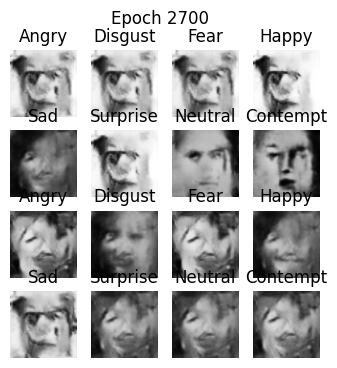

Epoch 2701/3000
  Generator loss: 1.2671 | Discriminator loss: 0.9145
Epoch 2702/3000
  Generator loss: 1.2701 | Discriminator loss: 0.9124
Epoch 2703/3000
  Generator loss: 1.2749 | Discriminator loss: 0.9146
Epoch 2704/3000
  Generator loss: 1.2774 | Discriminator loss: 0.9141
Epoch 2705/3000
  Generator loss: 1.2982 | Discriminator loss: 0.9162
  Checkpoint saved at epoch 2705.
Epoch 2706/3000
  Generator loss: 1.2698 | Discriminator loss: 0.9195
Epoch 2707/3000
  Generator loss: 1.2782 | Discriminator loss: 0.9156
Epoch 2708/3000
  Generator loss: 1.2791 | Discriminator loss: 0.9141
Epoch 2709/3000
  Generator loss: 1.2725 | Discriminator loss: 0.9115
Epoch 2710/3000
  Generator loss: 1.2875 | Discriminator loss: 0.9135
  Checkpoint saved at epoch 2710.


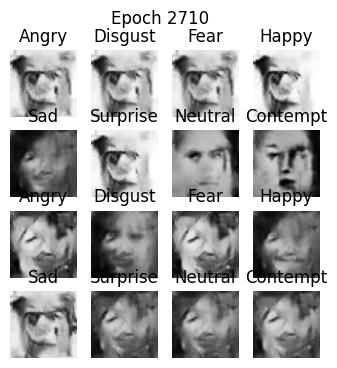

Epoch 2711/3000
  Generator loss: 1.2688 | Discriminator loss: 0.9151
Epoch 2712/3000
  Generator loss: 1.2645 | Discriminator loss: 0.9208
Epoch 2713/3000
  Generator loss: 1.2877 | Discriminator loss: 0.9166
Epoch 2714/3000
  Generator loss: 1.2731 | Discriminator loss: 0.9161
Epoch 2715/3000
  Generator loss: 1.2782 | Discriminator loss: 0.9143
  Checkpoint saved at epoch 2715.
Epoch 2716/3000
  Generator loss: 1.2660 | Discriminator loss: 0.9187
Epoch 2717/3000
  Generator loss: 1.2748 | Discriminator loss: 0.9135
Epoch 2718/3000
  Generator loss: 1.2624 | Discriminator loss: 0.9170
Epoch 2719/3000
  Generator loss: 1.2647 | Discriminator loss: 0.9180
Epoch 2720/3000
  Generator loss: 1.2820 | Discriminator loss: 0.9139
  Checkpoint saved at epoch 2720.


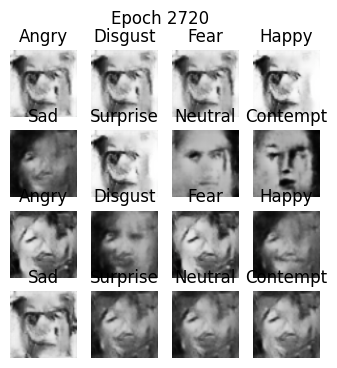

Epoch 2721/3000
  Generator loss: 1.2689 | Discriminator loss: 0.9156
Epoch 2722/3000
  Generator loss: 1.2787 | Discriminator loss: 0.9092
Epoch 2723/3000
  Generator loss: 1.2637 | Discriminator loss: 0.9191
Epoch 2724/3000
  Generator loss: 1.2772 | Discriminator loss: 0.9135
Epoch 2725/3000
  Generator loss: 1.2806 | Discriminator loss: 0.9107
  Checkpoint saved at epoch 2725.
Epoch 2726/3000
  Generator loss: 1.2679 | Discriminator loss: 0.9211
Epoch 2727/3000
  Generator loss: 1.2725 | Discriminator loss: 0.9134
Epoch 2728/3000
  Generator loss: 1.3125 | Discriminator loss: 0.9111
Epoch 2729/3000
  Generator loss: 1.2779 | Discriminator loss: 0.9175
Epoch 2730/3000
  Generator loss: 1.2622 | Discriminator loss: 0.9178
  Checkpoint saved at epoch 2730.


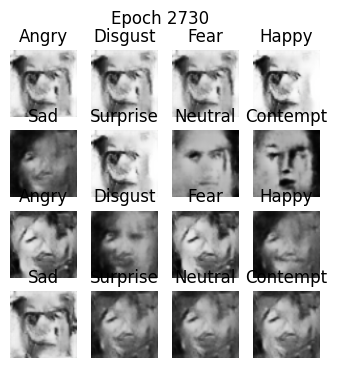

Epoch 2731/3000
  Generator loss: 1.2771 | Discriminator loss: 0.9193
Epoch 2732/3000
  Generator loss: 1.2801 | Discriminator loss: 0.9148
Epoch 2733/3000
  Generator loss: 1.2752 | Discriminator loss: 0.9160
Epoch 2734/3000
  Generator loss: 1.2737 | Discriminator loss: 0.9097
Epoch 2735/3000
  Generator loss: 1.2616 | Discriminator loss: 0.9211
  Checkpoint saved at epoch 2735.
Epoch 2736/3000
  Generator loss: 1.2786 | Discriminator loss: 0.9149
Epoch 2737/3000
  Generator loss: 1.2767 | Discriminator loss: 0.9146
Epoch 2738/3000
  Generator loss: 1.2700 | Discriminator loss: 0.9153
Epoch 2739/3000
  Generator loss: 1.2683 | Discriminator loss: 0.9184
Epoch 2740/3000
  Generator loss: 1.2652 | Discriminator loss: 0.9212
  Checkpoint saved at epoch 2740.


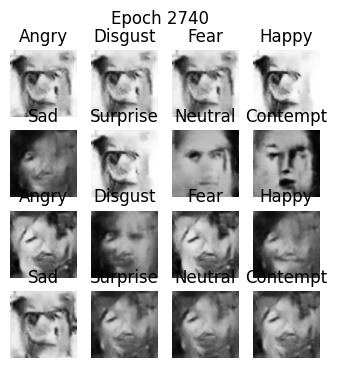

Epoch 2741/3000
  Generator loss: 1.2655 | Discriminator loss: 0.9206
Epoch 2742/3000
  Generator loss: 1.2797 | Discriminator loss: 0.9159
Epoch 2743/3000
  Generator loss: 1.2678 | Discriminator loss: 0.9123
Epoch 2744/3000
  Generator loss: 1.2859 | Discriminator loss: 0.9163
Epoch 2745/3000
  Generator loss: 1.2761 | Discriminator loss: 0.9171
  Checkpoint saved at epoch 2745.
Epoch 2746/3000
  Generator loss: 1.2861 | Discriminator loss: 0.9101
Epoch 2747/3000
  Generator loss: 1.2746 | Discriminator loss: 0.9155
Epoch 2748/3000
  Generator loss: 1.2663 | Discriminator loss: 0.9212
Epoch 2749/3000
  Generator loss: 1.2770 | Discriminator loss: 0.9140
Epoch 2750/3000
  Generator loss: 1.2736 | Discriminator loss: 0.9147
  Checkpoint saved at epoch 2750.
Training history saved at epoch 2750 to ./training_history\history_epoch_2750.pkl


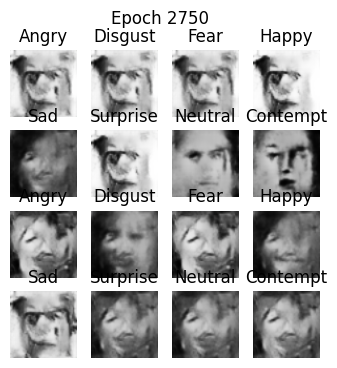

Epoch 2751/3000
  Generator loss: 1.2659 | Discriminator loss: 0.9188
Epoch 2752/3000
  Generator loss: 1.2843 | Discriminator loss: 0.9153
Epoch 2753/3000
  Generator loss: 1.2698 | Discriminator loss: 0.9153
Epoch 2754/3000
  Generator loss: 1.2652 | Discriminator loss: 0.9189
Epoch 2755/3000
  Generator loss: 1.2742 | Discriminator loss: 0.9100
  Checkpoint saved at epoch 2755.
Epoch 2756/3000
  Generator loss: 1.2811 | Discriminator loss: 0.9113
Epoch 2757/3000
  Generator loss: 1.2747 | Discriminator loss: 0.9167
Epoch 2758/3000
  Generator loss: 1.2689 | Discriminator loss: 0.9174
Epoch 2759/3000
  Generator loss: 1.2860 | Discriminator loss: 0.9129
Epoch 2760/3000
  Generator loss: 1.2763 | Discriminator loss: 0.9127
  Checkpoint saved at epoch 2760.


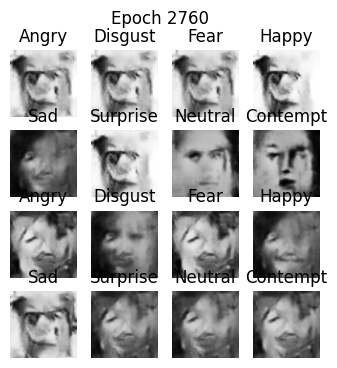

Epoch 2761/3000
  Generator loss: 1.2750 | Discriminator loss: 0.9174
Epoch 2762/3000
  Generator loss: 1.2773 | Discriminator loss: 0.9132
Epoch 2763/3000
  Generator loss: 1.2830 | Discriminator loss: 0.9137
Epoch 2764/3000
  Generator loss: 1.2682 | Discriminator loss: 0.9142
Epoch 2765/3000
  Generator loss: 1.2835 | Discriminator loss: 0.9133
  Checkpoint saved at epoch 2765.
Epoch 2766/3000
  Generator loss: 1.2674 | Discriminator loss: 0.9165
Epoch 2767/3000
  Generator loss: 1.2587 | Discriminator loss: 0.9248
Epoch 2768/3000
  Generator loss: 1.2780 | Discriminator loss: 0.9085
Epoch 2769/3000
  Generator loss: 1.2622 | Discriminator loss: 0.9235
Epoch 2770/3000
  Generator loss: 1.2719 | Discriminator loss: 0.9142
  Checkpoint saved at epoch 2770.


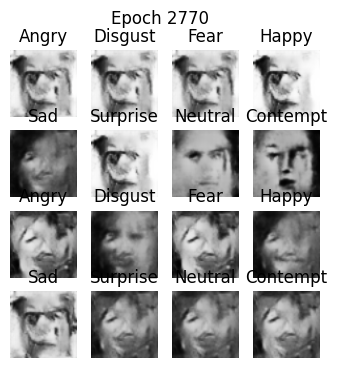

Epoch 2771/3000
  Generator loss: 1.2902 | Discriminator loss: 0.9117
Epoch 2772/3000
  Generator loss: 1.2696 | Discriminator loss: 0.9213
Epoch 2773/3000
  Generator loss: 1.2641 | Discriminator loss: 0.9205
Epoch 2774/3000
  Generator loss: 1.2707 | Discriminator loss: 0.9187
Epoch 2775/3000
  Generator loss: 1.2746 | Discriminator loss: 0.9157
  Checkpoint saved at epoch 2775.
Epoch 2776/3000
  Generator loss: 1.2696 | Discriminator loss: 0.9205
Epoch 2777/3000
  Generator loss: 1.2763 | Discriminator loss: 0.9156
Epoch 2778/3000
  Generator loss: 1.2795 | Discriminator loss: 0.9107
Epoch 2779/3000
  Generator loss: 1.2628 | Discriminator loss: 0.9199
Epoch 2780/3000
  Generator loss: 1.2694 | Discriminator loss: 0.9190
  Checkpoint saved at epoch 2780.


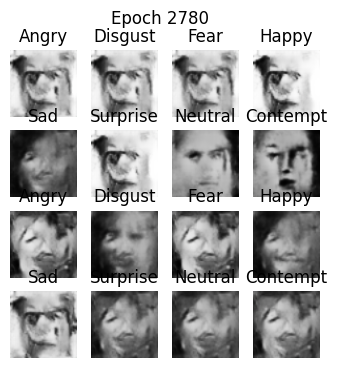

Epoch 2781/3000
  Generator loss: 1.2751 | Discriminator loss: 0.9158
Epoch 2782/3000
  Generator loss: 1.2724 | Discriminator loss: 0.9174
Epoch 2783/3000
  Generator loss: 1.2745 | Discriminator loss: 0.9148
Epoch 2784/3000
  Generator loss: 1.2735 | Discriminator loss: 0.9185
Epoch 2785/3000
  Generator loss: 1.2797 | Discriminator loss: 0.9133
  Checkpoint saved at epoch 2785.
Epoch 2786/3000
  Generator loss: 1.2750 | Discriminator loss: 0.9123
Epoch 2787/3000
  Generator loss: 1.2822 | Discriminator loss: 0.9120
Epoch 2788/3000
  Generator loss: 1.2880 | Discriminator loss: 0.9120
Epoch 2789/3000
  Generator loss: 1.2778 | Discriminator loss: 0.9127
Epoch 2790/3000
  Generator loss: 1.2755 | Discriminator loss: 0.9165
  Checkpoint saved at epoch 2790.


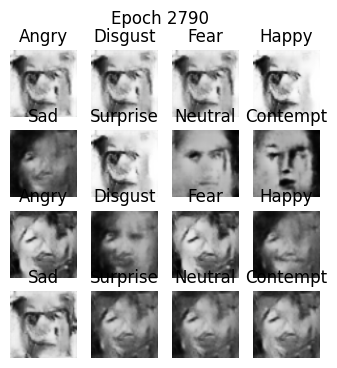

Epoch 2791/3000
  Generator loss: 1.2707 | Discriminator loss: 0.9165
Epoch 2792/3000
  Generator loss: 1.2841 | Discriminator loss: 0.9142
Epoch 2793/3000
  Generator loss: 1.2706 | Discriminator loss: 0.9116
Epoch 2794/3000
  Generator loss: 1.2744 | Discriminator loss: 0.9184
Epoch 2795/3000
  Generator loss: 1.2736 | Discriminator loss: 0.9137
  Checkpoint saved at epoch 2795.
Epoch 2796/3000
  Generator loss: 1.2668 | Discriminator loss: 0.9184
Epoch 2797/3000
  Generator loss: 1.2824 | Discriminator loss: 0.9101
Epoch 2798/3000
  Generator loss: 1.3291 | Discriminator loss: 0.9107
Epoch 2799/3000
  Generator loss: 1.2760 | Discriminator loss: 0.9157
Epoch 2800/3000
  Generator loss: 1.2784 | Discriminator loss: 0.9134
  Checkpoint saved at epoch 2800.
Training history saved at epoch 2800 to ./training_history\history_epoch_2800.pkl


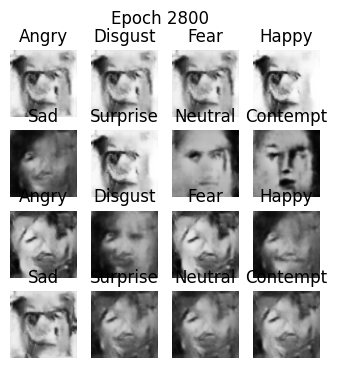

Epoch 2801/3000
  Generator loss: 1.2610 | Discriminator loss: 0.9192
Epoch 2802/3000
  Generator loss: 1.2710 | Discriminator loss: 0.9171
Epoch 2803/3000
  Generator loss: 1.2711 | Discriminator loss: 0.9156
Epoch 2804/3000
  Generator loss: 1.2661 | Discriminator loss: 0.9190
Epoch 2805/3000
  Generator loss: 1.2824 | Discriminator loss: 0.9100
  Checkpoint saved at epoch 2805.
Epoch 2806/3000
  Generator loss: 1.2757 | Discriminator loss: 0.9148
Epoch 2807/3000
  Generator loss: 1.2724 | Discriminator loss: 0.9152
Epoch 2808/3000
  Generator loss: 1.2736 | Discriminator loss: 0.9126
Epoch 2809/3000
  Generator loss: 1.2727 | Discriminator loss: 0.9167
Epoch 2810/3000
  Generator loss: 1.2709 | Discriminator loss: 0.9167
  Checkpoint saved at epoch 2810.


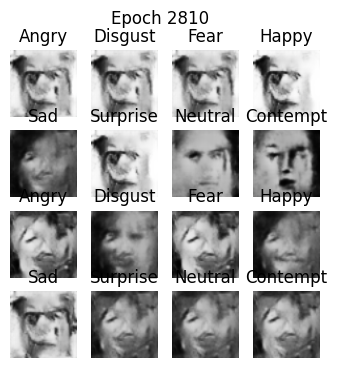

Epoch 2811/3000
  Generator loss: 1.2724 | Discriminator loss: 0.9151
Epoch 2812/3000
  Generator loss: 1.2802 | Discriminator loss: 0.9127
Epoch 2813/3000
  Generator loss: 1.2740 | Discriminator loss: 0.9152
Epoch 2814/3000
  Generator loss: 1.2662 | Discriminator loss: 0.9186
Epoch 2815/3000
  Generator loss: 1.2610 | Discriminator loss: 0.9183
  Checkpoint saved at epoch 2815.
Epoch 2816/3000
  Generator loss: 1.2690 | Discriminator loss: 0.9161
Epoch 2817/3000
  Generator loss: 1.2755 | Discriminator loss: 0.9136
Epoch 2818/3000
  Generator loss: 1.2838 | Discriminator loss: 0.9119
Epoch 2819/3000
  Generator loss: 1.2846 | Discriminator loss: 0.9137
Epoch 2820/3000
  Generator loss: 1.2681 | Discriminator loss: 0.9143
  Checkpoint saved at epoch 2820.


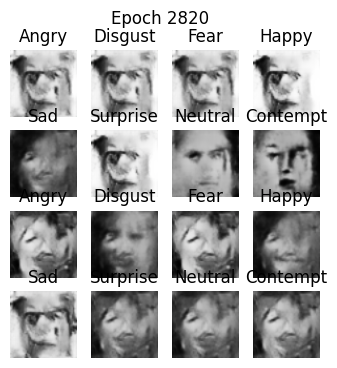

Epoch 2821/3000
  Generator loss: 1.2638 | Discriminator loss: 0.9162
Epoch 2822/3000
  Generator loss: 1.2651 | Discriminator loss: 0.9182
Epoch 2823/3000
  Generator loss: 1.2684 | Discriminator loss: 0.9168
Epoch 2824/3000
  Generator loss: 1.2718 | Discriminator loss: 0.9157
Epoch 2825/3000
  Generator loss: 1.2917 | Discriminator loss: 0.9084
  Checkpoint saved at epoch 2825.
Epoch 2826/3000
  Generator loss: 1.2712 | Discriminator loss: 0.9173
Epoch 2827/3000
  Generator loss: 1.2713 | Discriminator loss: 0.9147
Epoch 2828/3000
  Generator loss: 1.2741 | Discriminator loss: 0.9184
Epoch 2829/3000
  Generator loss: 1.2730 | Discriminator loss: 0.9134
Epoch 2830/3000
  Generator loss: 1.2928 | Discriminator loss: 0.9129
  Checkpoint saved at epoch 2830.


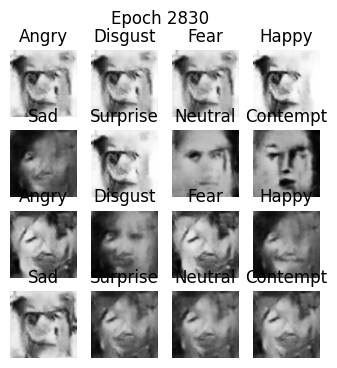

Epoch 2831/3000
  Generator loss: 1.2732 | Discriminator loss: 0.9173
Epoch 2832/3000
  Generator loss: 1.2623 | Discriminator loss: 0.9215
Epoch 2833/3000
  Generator loss: 1.2871 | Discriminator loss: 0.9148
Epoch 2834/3000
  Generator loss: 1.2676 | Discriminator loss: 0.9150
Epoch 2835/3000
  Generator loss: 1.2705 | Discriminator loss: 0.9138
  Checkpoint saved at epoch 2835.
Epoch 2836/3000
  Generator loss: 1.2670 | Discriminator loss: 0.9190
Epoch 2837/3000
  Generator loss: 1.2801 | Discriminator loss: 0.9110
Epoch 2838/3000
  Generator loss: 1.2649 | Discriminator loss: 0.9191
Epoch 2839/3000
  Generator loss: 1.2801 | Discriminator loss: 0.9140
Epoch 2840/3000
  Generator loss: 1.2658 | Discriminator loss: 0.9187
  Checkpoint saved at epoch 2840.


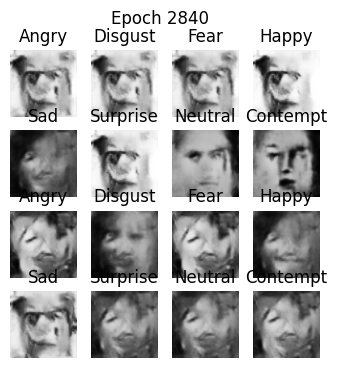

Epoch 2841/3000
  Generator loss: 1.2941 | Discriminator loss: 0.9095
Epoch 2842/3000
  Generator loss: 1.2697 | Discriminator loss: 0.9160
Epoch 2843/3000
  Generator loss: 1.2645 | Discriminator loss: 0.9193
Epoch 2844/3000
  Generator loss: 1.2738 | Discriminator loss: 0.9115
Epoch 2845/3000
  Generator loss: 1.2816 | Discriminator loss: 0.9097
  Checkpoint saved at epoch 2845.
Epoch 2846/3000
  Generator loss: 1.2679 | Discriminator loss: 0.9154
Epoch 2847/3000
  Generator loss: 1.2703 | Discriminator loss: 0.9197
Epoch 2848/3000
  Generator loss: 1.2670 | Discriminator loss: 0.9178
Epoch 2849/3000
  Generator loss: 1.2716 | Discriminator loss: 0.9165
Epoch 2850/3000
  Generator loss: 1.2783 | Discriminator loss: 0.9199
  Checkpoint saved at epoch 2850.
Training history saved at epoch 2850 to ./training_history\history_epoch_2850.pkl


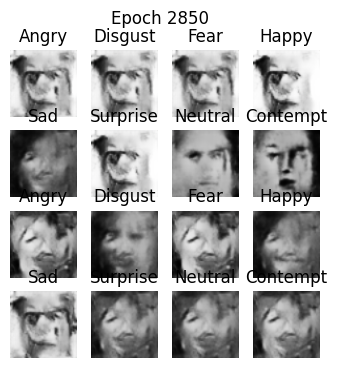

Epoch 2851/3000
  Generator loss: 1.2850 | Discriminator loss: 0.9129
Epoch 2852/3000
  Generator loss: 1.2618 | Discriminator loss: 0.9164
Epoch 2853/3000
  Generator loss: 1.2725 | Discriminator loss: 0.9144
Epoch 2854/3000
  Generator loss: 1.2734 | Discriminator loss: 0.9130
Epoch 2855/3000
  Generator loss: 1.2740 | Discriminator loss: 0.9104
  Checkpoint saved at epoch 2855.
Epoch 2856/3000
  Generator loss: 1.2628 | Discriminator loss: 0.9178
Epoch 2857/3000
  Generator loss: 1.2766 | Discriminator loss: 0.9175
Epoch 2858/3000
  Generator loss: 1.2688 | Discriminator loss: 0.9164
Epoch 2859/3000
  Generator loss: 1.2670 | Discriminator loss: 0.9203
Epoch 2860/3000
  Generator loss: 1.2701 | Discriminator loss: 0.9193
  Checkpoint saved at epoch 2860.


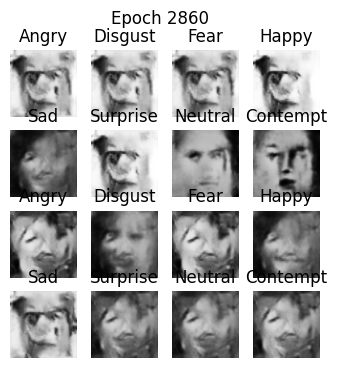

Epoch 2861/3000
  Generator loss: 1.3077 | Discriminator loss: 0.9157
Epoch 2862/3000
  Generator loss: 1.2809 | Discriminator loss: 0.9111
Epoch 2863/3000
  Generator loss: 1.2769 | Discriminator loss: 0.9172
Epoch 2864/3000
  Generator loss: 1.2649 | Discriminator loss: 0.9188
Epoch 2865/3000
  Generator loss: 1.2755 | Discriminator loss: 0.9142
  Checkpoint saved at epoch 2865.
Epoch 2866/3000
  Generator loss: 1.2744 | Discriminator loss: 0.9129
Epoch 2867/3000
  Generator loss: 1.2771 | Discriminator loss: 0.9123
Epoch 2868/3000
  Generator loss: 1.2725 | Discriminator loss: 0.9161
Epoch 2869/3000
  Generator loss: 1.2750 | Discriminator loss: 0.9122
Epoch 2870/3000
  Generator loss: 1.2633 | Discriminator loss: 0.9203
  Checkpoint saved at epoch 2870.


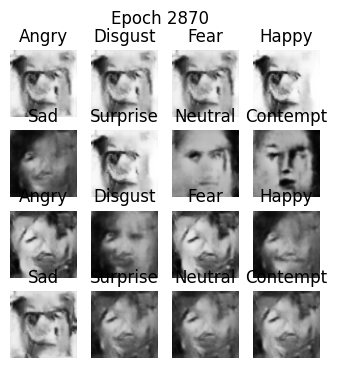

Epoch 2871/3000
  Generator loss: 1.2691 | Discriminator loss: 0.9176
Epoch 2872/3000
  Generator loss: 1.2860 | Discriminator loss: 0.9102
Epoch 2873/3000
  Generator loss: 1.2646 | Discriminator loss: 0.9182
Epoch 2874/3000
  Generator loss: 1.2772 | Discriminator loss: 0.9134
Epoch 2875/3000
  Generator loss: 1.2685 | Discriminator loss: 0.9206
  Checkpoint saved at epoch 2875.
Epoch 2876/3000
  Generator loss: 1.2803 | Discriminator loss: 0.9115
Epoch 2877/3000
  Generator loss: 1.2860 | Discriminator loss: 0.9073
Epoch 2878/3000
  Generator loss: 1.2732 | Discriminator loss: 0.9153
Epoch 2879/3000
  Generator loss: 1.2911 | Discriminator loss: 0.9109
Epoch 2880/3000
  Generator loss: 1.2622 | Discriminator loss: 0.9187
  Checkpoint saved at epoch 2880.


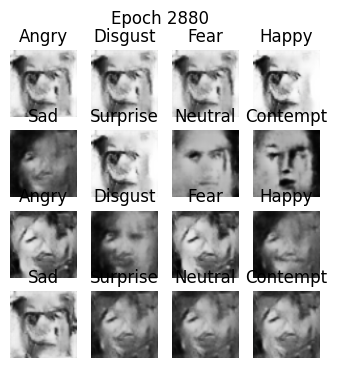

Epoch 2881/3000
  Generator loss: 1.2742 | Discriminator loss: 0.9152
Epoch 2882/3000
  Generator loss: 1.2782 | Discriminator loss: 0.9136
Epoch 2883/3000
  Generator loss: 1.2744 | Discriminator loss: 0.9175
Epoch 2884/3000
  Generator loss: 1.2776 | Discriminator loss: 0.9158
Epoch 2885/3000
  Generator loss: 1.2775 | Discriminator loss: 0.9125
  Checkpoint saved at epoch 2885.
Epoch 2886/3000
  Generator loss: 1.2743 | Discriminator loss: 0.9174
Epoch 2887/3000
  Generator loss: 1.2675 | Discriminator loss: 0.9194
Epoch 2888/3000
  Generator loss: 1.2821 | Discriminator loss: 0.9142
Epoch 2889/3000
  Generator loss: 1.2841 | Discriminator loss: 0.9131
Epoch 2890/3000
  Generator loss: 1.2681 | Discriminator loss: 0.9136
  Checkpoint saved at epoch 2890.


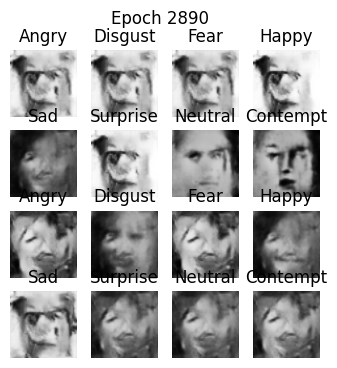

Epoch 2891/3000
  Generator loss: 1.2680 | Discriminator loss: 0.9196
Epoch 2892/3000
  Generator loss: 1.2738 | Discriminator loss: 0.9140
Epoch 2893/3000
  Generator loss: 1.2800 | Discriminator loss: 0.9117
Epoch 2894/3000
  Generator loss: 1.2675 | Discriminator loss: 0.9176
Epoch 2895/3000
  Generator loss: 1.2673 | Discriminator loss: 0.9202
  Checkpoint saved at epoch 2895.
Epoch 2896/3000
  Generator loss: 1.2712 | Discriminator loss: 0.9181
Epoch 2897/3000
  Generator loss: 1.2745 | Discriminator loss: 0.9140
Epoch 2898/3000
  Generator loss: 1.2960 | Discriminator loss: 0.9078
Epoch 2899/3000
  Generator loss: 1.2767 | Discriminator loss: 0.9120
Epoch 2900/3000
  Generator loss: 1.2748 | Discriminator loss: 0.9158
  Checkpoint saved at epoch 2900.
Training history saved at epoch 2900 to ./training_history\history_epoch_2900.pkl


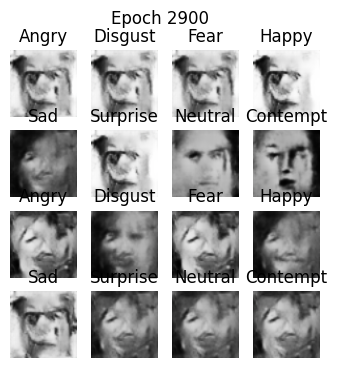

Epoch 2901/3000
  Generator loss: 1.2773 | Discriminator loss: 0.9145
Epoch 2902/3000
  Generator loss: 1.2636 | Discriminator loss: 0.9186
Epoch 2903/3000
  Generator loss: 1.2664 | Discriminator loss: 0.9171
Epoch 2904/3000
  Generator loss: 1.2768 | Discriminator loss: 0.9161
Epoch 2905/3000
  Generator loss: 1.2773 | Discriminator loss: 0.9111
  Checkpoint saved at epoch 2905.
Epoch 2906/3000
  Generator loss: 1.2777 | Discriminator loss: 0.9160
Epoch 2907/3000
  Generator loss: 1.2578 | Discriminator loss: 0.9205
Epoch 2908/3000
  Generator loss: 1.2634 | Discriminator loss: 0.9196
Epoch 2909/3000
  Generator loss: 1.2763 | Discriminator loss: 0.9140
Epoch 2910/3000
  Generator loss: 1.2831 | Discriminator loss: 0.9122
  Checkpoint saved at epoch 2910.


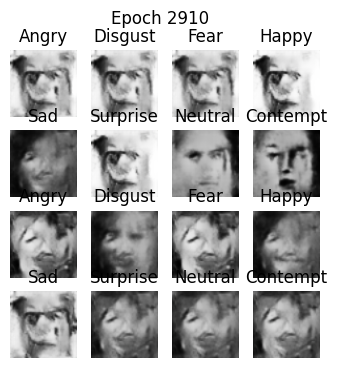

Epoch 2911/3000
  Generator loss: 1.2722 | Discriminator loss: 0.9140
Epoch 2912/3000
  Generator loss: 1.2661 | Discriminator loss: 0.9151
Epoch 2913/3000
  Generator loss: 1.2776 | Discriminator loss: 0.9153
Epoch 2914/3000
  Generator loss: 1.2718 | Discriminator loss: 0.9198
Epoch 2915/3000
  Generator loss: 1.2881 | Discriminator loss: 0.9116
  Checkpoint saved at epoch 2915.
Epoch 2916/3000
  Generator loss: 1.2729 | Discriminator loss: 0.9153
Epoch 2917/3000
  Generator loss: 1.2602 | Discriminator loss: 0.9196
Epoch 2918/3000
  Generator loss: 1.2721 | Discriminator loss: 0.9149
Epoch 2919/3000
  Generator loss: 1.2797 | Discriminator loss: 0.9145
Epoch 2920/3000
  Generator loss: 1.2762 | Discriminator loss: 0.9165
  Checkpoint saved at epoch 2920.


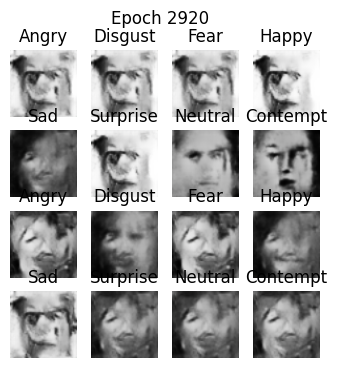

Epoch 2921/3000
  Generator loss: 1.2694 | Discriminator loss: 0.9156
Epoch 2922/3000
  Generator loss: 1.2807 | Discriminator loss: 0.9149
Epoch 2923/3000
  Generator loss: 1.2709 | Discriminator loss: 0.9129
Epoch 2924/3000
  Generator loss: 1.2861 | Discriminator loss: 0.9120
Epoch 2925/3000
  Generator loss: 1.2809 | Discriminator loss: 0.9178
  Checkpoint saved at epoch 2925.
Epoch 2926/3000
  Generator loss: 1.2724 | Discriminator loss: 0.9166
Epoch 2927/3000
  Generator loss: 1.2767 | Discriminator loss: 0.9188
Epoch 2928/3000
  Generator loss: 1.2687 | Discriminator loss: 0.9131
Epoch 2929/3000
  Generator loss: 1.2886 | Discriminator loss: 0.9134
Epoch 2930/3000
  Generator loss: 1.2734 | Discriminator loss: 0.9145
  Checkpoint saved at epoch 2930.


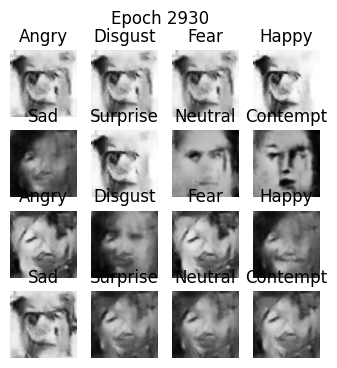

Epoch 2931/3000
  Generator loss: 1.2686 | Discriminator loss: 0.9188
Epoch 2932/3000
  Generator loss: 1.2554 | Discriminator loss: 0.9242
Epoch 2933/3000
  Generator loss: 1.2794 | Discriminator loss: 0.9125
Epoch 2934/3000
  Generator loss: 1.2718 | Discriminator loss: 0.9125
Epoch 2935/3000
  Generator loss: 1.2734 | Discriminator loss: 0.9166
  Checkpoint saved at epoch 2935.
Epoch 2936/3000
  Generator loss: 1.3056 | Discriminator loss: 0.9113
Epoch 2937/3000
  Generator loss: 1.2765 | Discriminator loss: 0.9118
Epoch 2938/3000
  Generator loss: 1.2744 | Discriminator loss: 0.9130
Epoch 2939/3000
  Generator loss: 1.2685 | Discriminator loss: 0.9175
Epoch 2940/3000
  Generator loss: 1.2646 | Discriminator loss: 0.9162
  Checkpoint saved at epoch 2940.


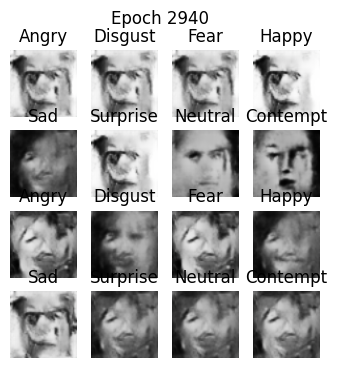

Epoch 2941/3000
  Generator loss: 1.2657 | Discriminator loss: 0.9185
Epoch 2942/3000
  Generator loss: 1.2626 | Discriminator loss: 0.9193
Epoch 2943/3000
  Generator loss: 1.2779 | Discriminator loss: 0.9106
Epoch 2944/3000
  Generator loss: 1.2695 | Discriminator loss: 0.9201
Epoch 2945/3000
  Generator loss: 1.2759 | Discriminator loss: 0.9160
  Checkpoint saved at epoch 2945.
Epoch 2946/3000
  Generator loss: 1.2693 | Discriminator loss: 0.9178
Epoch 2947/3000
  Generator loss: 1.2796 | Discriminator loss: 0.9152
Epoch 2948/3000
  Generator loss: 1.2594 | Discriminator loss: 0.9217
Epoch 2949/3000
  Generator loss: 1.2763 | Discriminator loss: 0.9159
Epoch 2950/3000
  Generator loss: 1.2847 | Discriminator loss: 0.9132
  Checkpoint saved at epoch 2950.
Training history saved at epoch 2950 to ./training_history\history_epoch_2950.pkl


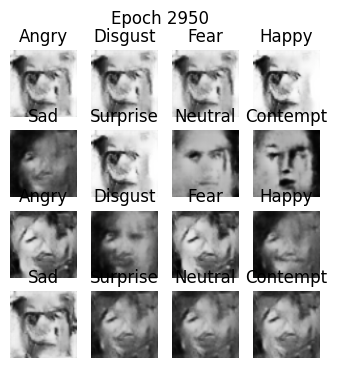

Epoch 2951/3000
  Generator loss: 1.2741 | Discriminator loss: 0.9128
Epoch 2952/3000
  Generator loss: 1.2640 | Discriminator loss: 0.9181
Epoch 2953/3000
  Generator loss: 1.2777 | Discriminator loss: 0.9135
Epoch 2954/3000
  Generator loss: 1.2804 | Discriminator loss: 0.9105
Epoch 2955/3000
  Generator loss: 1.2742 | Discriminator loss: 0.9151
  Checkpoint saved at epoch 2955.
Epoch 2956/3000
  Generator loss: 1.2727 | Discriminator loss: 0.9112
Epoch 2957/3000
  Generator loss: 1.2971 | Discriminator loss: 0.9136
Epoch 2958/3000
  Generator loss: 1.2749 | Discriminator loss: 0.9152
Epoch 2959/3000
  Generator loss: 1.2770 | Discriminator loss: 0.9138
Epoch 2960/3000
  Generator loss: 1.2776 | Discriminator loss: 0.9111
  Checkpoint saved at epoch 2960.


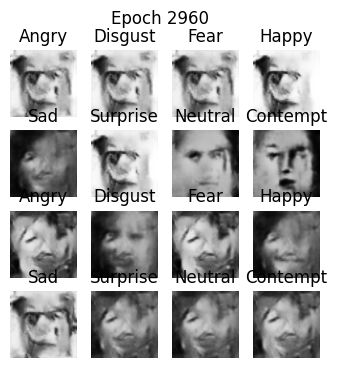

Epoch 2961/3000
  Generator loss: 1.2852 | Discriminator loss: 0.9113
Epoch 2962/3000
  Generator loss: 1.2626 | Discriminator loss: 0.9176
Epoch 2963/3000
  Generator loss: 1.2714 | Discriminator loss: 0.9152
Epoch 2964/3000
  Generator loss: 1.2860 | Discriminator loss: 0.9130
Epoch 2965/3000
  Generator loss: 1.2740 | Discriminator loss: 0.9159
  Checkpoint saved at epoch 2965.
Epoch 2966/3000
  Generator loss: 1.2664 | Discriminator loss: 0.9192
Epoch 2967/3000
  Generator loss: 1.2778 | Discriminator loss: 0.9209
Epoch 2968/3000
  Generator loss: 1.2774 | Discriminator loss: 0.9134
Epoch 2969/3000
  Generator loss: 1.2776 | Discriminator loss: 0.9136
Epoch 2970/3000
  Generator loss: 1.2668 | Discriminator loss: 0.9220
  Checkpoint saved at epoch 2970.


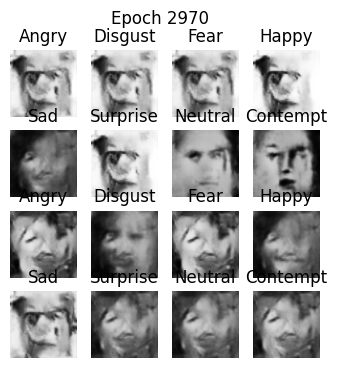

Epoch 2971/3000
  Generator loss: 1.2888 | Discriminator loss: 0.9092
Epoch 2972/3000
  Generator loss: 1.2613 | Discriminator loss: 0.9187
Epoch 2973/3000
  Generator loss: 1.2707 | Discriminator loss: 0.9161
Epoch 2974/3000
  Generator loss: 1.2697 | Discriminator loss: 0.9179
Epoch 2975/3000
  Generator loss: 1.2755 | Discriminator loss: 0.9183
  Checkpoint saved at epoch 2975.
Epoch 2976/3000
  Generator loss: 1.2713 | Discriminator loss: 0.9159
Epoch 2977/3000
  Generator loss: 1.2746 | Discriminator loss: 0.9163
Epoch 2978/3000
  Generator loss: 1.2691 | Discriminator loss: 0.9159
Epoch 2979/3000
  Generator loss: 1.2736 | Discriminator loss: 0.9143
Epoch 2980/3000
  Generator loss: 1.2676 | Discriminator loss: 0.9173
  Checkpoint saved at epoch 2980.


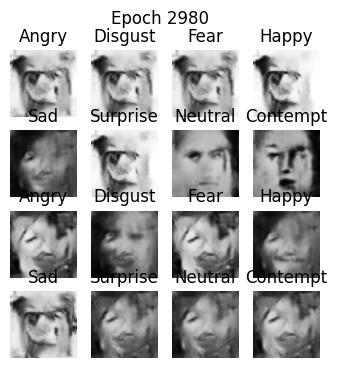

Epoch 2981/3000
  Generator loss: 1.2583 | Discriminator loss: 0.9250
Epoch 2982/3000
  Generator loss: 1.2736 | Discriminator loss: 0.9142
Epoch 2983/3000
  Generator loss: 1.2874 | Discriminator loss: 0.9159
Epoch 2984/3000
  Generator loss: 1.2752 | Discriminator loss: 0.9153
Epoch 2985/3000
  Generator loss: 1.2918 | Discriminator loss: 0.9078
  Checkpoint saved at epoch 2985.
Epoch 2986/3000
  Generator loss: 1.2796 | Discriminator loss: 0.9132
Epoch 2987/3000
  Generator loss: 1.2788 | Discriminator loss: 0.9135
Epoch 2988/3000
  Generator loss: 1.2842 | Discriminator loss: 0.9168
Epoch 2989/3000
  Generator loss: 1.2694 | Discriminator loss: 0.9211
Epoch 2990/3000
  Generator loss: 1.2794 | Discriminator loss: 0.9108
  Checkpoint saved at epoch 2990.


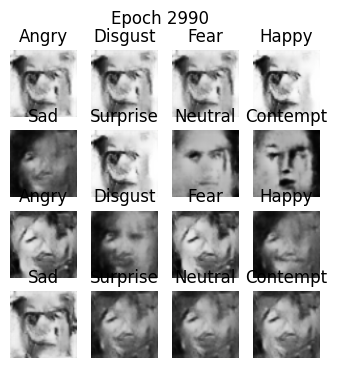

Epoch 2991/3000
  Generator loss: 1.2740 | Discriminator loss: 0.9125
Epoch 2992/3000
  Generator loss: 1.2787 | Discriminator loss: 0.9096
Epoch 2993/3000
  Generator loss: 1.2687 | Discriminator loss: 0.9161
Epoch 2994/3000
  Generator loss: 1.3030 | Discriminator loss: 0.9105
Epoch 2995/3000
  Generator loss: 1.2654 | Discriminator loss: 0.9152
  Checkpoint saved at epoch 2995.
Epoch 2996/3000
  Generator loss: 1.2869 | Discriminator loss: 0.9079
Epoch 2997/3000
  Generator loss: 1.2790 | Discriminator loss: 0.9135
Epoch 2998/3000
  Generator loss: 1.2703 | Discriminator loss: 0.9157
Epoch 2999/3000
  Generator loss: 1.2679 | Discriminator loss: 0.9163
Epoch 3000/3000
  Generator loss: 1.2678 | Discriminator loss: 0.9170
  Checkpoint saved at epoch 3000.
Training history saved at epoch 3000 to ./training_history\history_epoch_3000.pkl


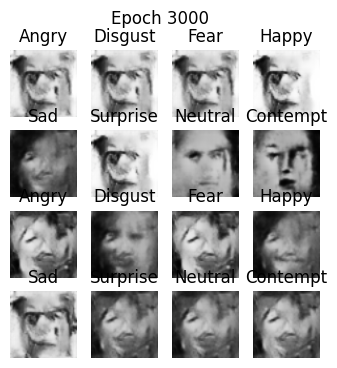

In [25]:
# Cell 10. Training Loop

# Define number of epochs
EPOCHS = 3000  # Set the total number of epochs for training

# Define a mapping from label indices to human-readable emotion names
emotion_names = [
    "Angry",     # 0
    "Disgust",   # 1
    "Fear",      # 2
    "Happy",     # 3
    "Sad",       # 4
    "Surprise",  # 5
    "Neutral",   # 6
    "Contempt"   # 7
]

# Seed for visualization of generated images
num_examples_to_generate = 16
seed_noise = tf.random.normal([num_examples_to_generate, noise_dim])
# Cycle through all 8 labels (or any pattern you like)
seed_labels = tf.convert_to_tensor([i % num_classes for i in range(num_examples_to_generate)], dtype=tf.int32)

# For recording history
history = {'gen_loss': [], 'disc_loss': []}

@tf.function
def train_step(images, labels):
    noise = tf.random.normal([tf.shape(images)[0], noise_dim])
    with tf.GradientTape(persistent=True) as tape:
        # Generate fake images using the generator
        generated_images = generator([noise, tf.expand_dims(labels, axis=1)], training=True)
        # Get discriminator outputs for real and fake images
        real_output = discriminator([images, tf.expand_dims(labels, axis=1)], training=True)
        fake_output = discriminator([generated_images, tf.expand_dims(labels, axis=1)], training=True)
        # Calculate losses
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    
    # Calculate gradients and update weights
    gradients_of_generator = tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = tape.gradient(disc_loss, discriminator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    return gen_loss, disc_loss

def generate_and_save_images(model, epoch, test_noise, test_labels):
    """Generate images using the model and display them with their emotion labels."""
    predictions = model([test_noise, tf.expand_dims(test_labels, axis=1)], training=False)
    fig = plt.figure(figsize=(4,4))
    
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        # Rescale back to [0,1]
        if predictions.shape[-1] == 1:
            # Grayscale image
            img = (predictions[i, :, :, 0] + 1.0) / 2.0
            plt.imshow(img, cmap='gray')
        else:
            # RGB image
            img = (predictions[i] + 1.0) / 2.0
            plt.imshow(img)
        # Use the emotion_names array for the title:
        label_idx = test_labels[i].numpy()
        plt.title(f'{emotion_names[label_idx]}')
        plt.axis('off')
    plt.suptitle(f'Epoch {epoch}')
    plt.show()

# Determine starting epoch from checkpoint (if restored)
start_epoch = int(checkpoint.epoch.numpy()) + 1  # If restored from checkpoint, else 1
print(f"Starting training at epoch {start_epoch}...")

# Training loop
for epoch in range(start_epoch, EPOCHS + 1):
    print(f"Epoch {epoch}/{EPOCHS}")
    gen_epoch_loss = []
    disc_epoch_loss = []
    
    for image_batch, label_batch in train_dataset:
        g_loss, d_loss = train_step(image_batch, label_batch)
        gen_epoch_loss.append(g_loss.numpy())
        disc_epoch_loss.append(d_loss.numpy())
    
    # Compute average losses for the epoch
    avg_gen_loss = np.mean(gen_epoch_loss)
    avg_disc_loss = np.mean(disc_epoch_loss)
    history['gen_loss'].append(avg_gen_loss)
    history['disc_loss'].append(avg_disc_loss)
    
    print(f"  Generator loss: {avg_gen_loss:.4f} | Discriminator loss: {avg_disc_loss:.4f}")
    
    # Update checkpoint epoch counter
    checkpoint.epoch.assign(epoch)
    
    # Save checkpoint every 5 epochs
    if epoch % 5 == 0:
        checkpoint.save(file_prefix=checkpoint_prefix)
        print(f"  Checkpoint saved at epoch {epoch}.")
    
    # Save training history every 50 epochs
    if epoch % 50 == 0:
        save_training_history(history, epoch)
    
    # Generate and display images every 10 epochs
    if epoch % 10 == 0:
        generate_and_save_images(generator, epoch, seed_noise, seed_labels)


In [28]:
# Save generator and discriminator weights for future use
generator.save_weights('generator_weights.weights.h5')
discriminator.save_weights('discriminator_weights.weights.h5')
print("Model weights saved.")


Model weights saved.


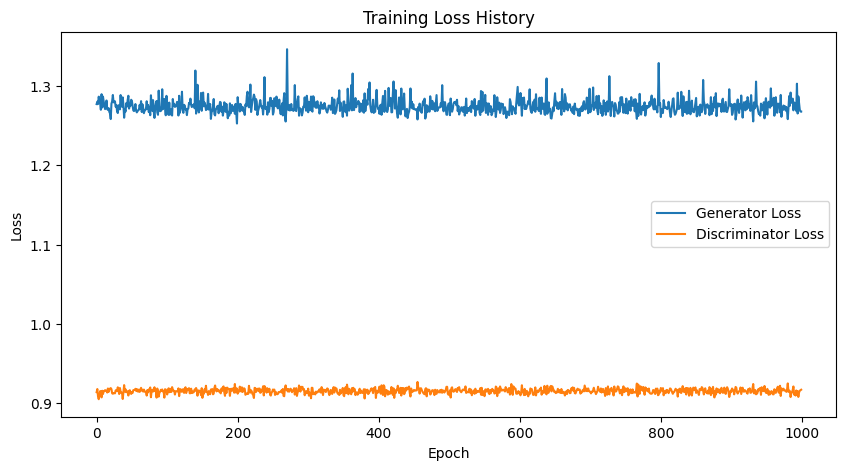

In [26]:
# Plot generator and discriminator loss curves
plt.figure(figsize=(10, 5))
plt.plot(history['gen_loss'], label='Generator Loss')
plt.plot(history['disc_loss'], label='Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss History')
plt.legend()
plt.show()


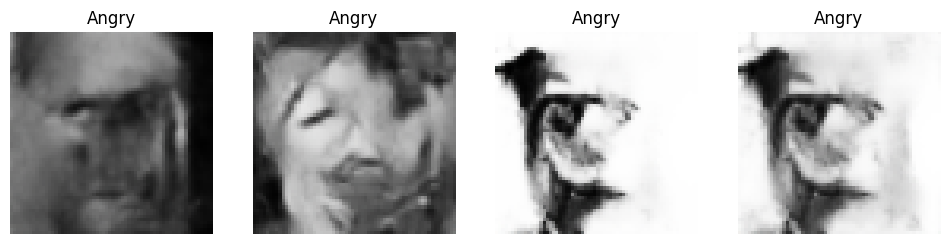

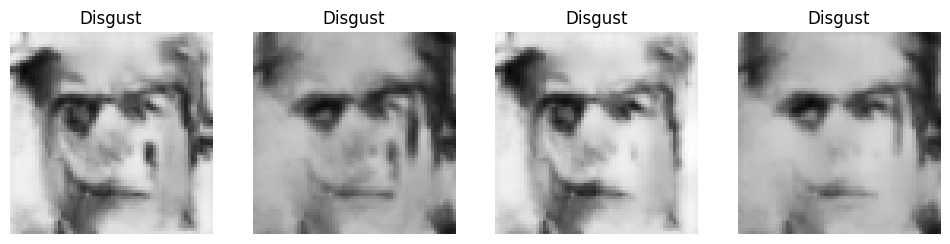

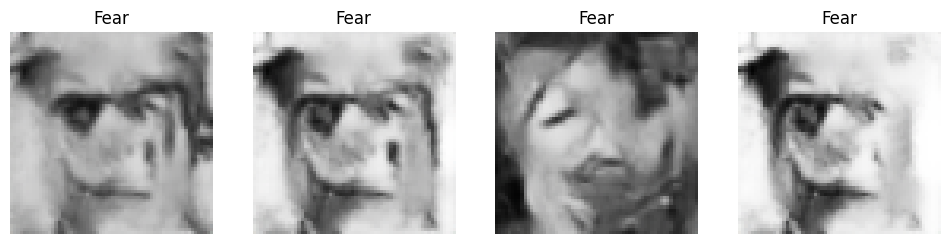

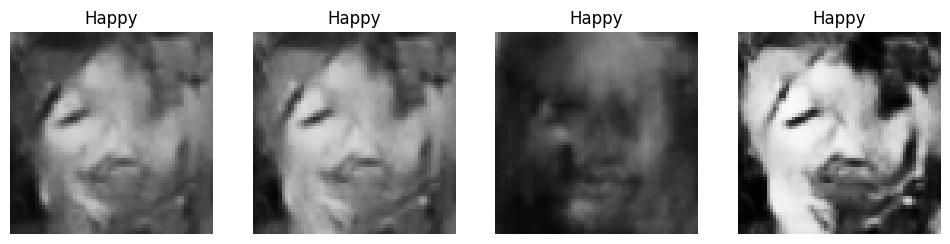

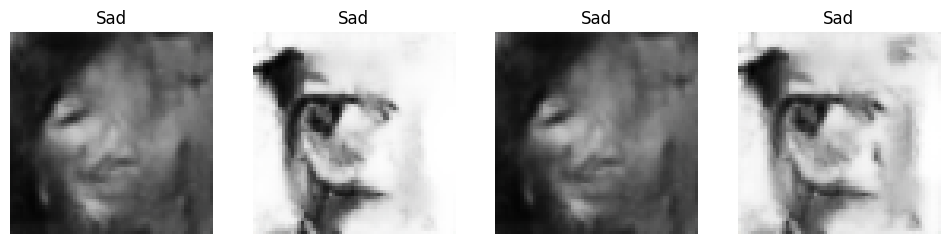

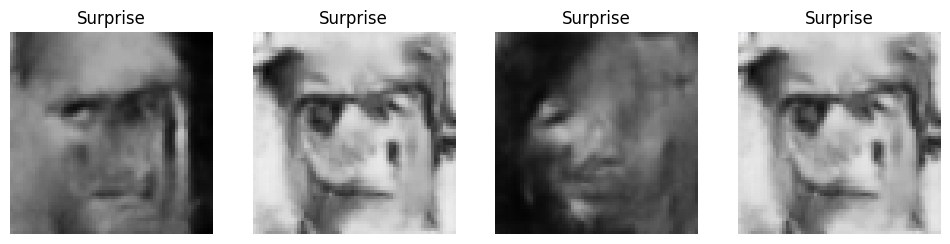

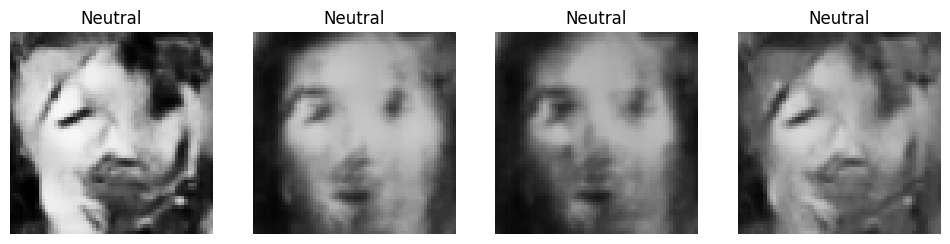

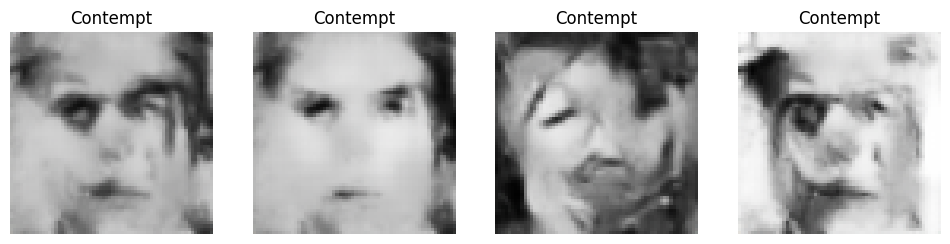

In [27]:
# Cell 13. Generate Sample Images for Each Emotion with Correct Emotion Names

# Define emotion names corresponding to label indices:
emotion_names = [
    "Angry",     # 0
    "Disgust",   # 1
    "Fear",      # 2
    "Happy",     # 3
    "Sad",       # 4
    "Surprise",  # 5
    "Neutral",   # 6
    "Contempt"   # 7
]

def generate_images_for_emotion(emotion, num_samples=4):
    noise = tf.random.normal([num_samples, noise_dim])
    labels = tf.convert_to_tensor([emotion] * num_samples, dtype=tf.int32)
    generated_images = generator([noise, tf.expand_dims(labels, axis=1)], training=False)
    
    fig, axes = plt.subplots(1, num_samples, figsize=(num_samples * 3, 3))
    for i in range(num_samples):
        ax = axes[i]
        # Check if the image is RGB (3 channels) or grayscale (1 channel)
        if generated_images.shape[-1] == 3:
            # Rescale RGB image from [-1, 1] to [0, 1]
            img = (generated_images[i].numpy() + 1.0) / 2.0
            ax.imshow(img)
        else:
            # Grayscale image case
            img = (generated_images[i, :, :, 0].numpy() + 1.0) / 2.0
            ax.imshow(img, cmap='gray')
        # Set title to the correct emotion name
        ax.set_title(emotion_names[emotion])
        ax.axis('off')
    plt.show()

# Generate sample images for each emotion (0 to 7)
for emotion in range(num_classes):
    generate_images_for_emotion(emotion)
